In [ ]:
######### Crawl data
!pip install typer

import os
os.chdir('D:/dissertation/session 2')

%run scrape.py get-metadata --from 2024-01-01 --to 2024-07-01 --industry-sector insurance,payment-protection-insurance
%run scrape.py download-decisions

In [1]:
################################## Merge files for insurance areas and insurance products
import pandas as pd

def merge_tables(complete_path, field_path):
    
    complete_df = pd.read_csv(complete_path)
    field_df = pd.read_excel(field_path)

    complete_df['decision_id_pdf'] = complete_df['decision_id'] + '.pdf'

    merged_df = complete_df.merge(field_df[['Filename', 'Product']], left_on='decision_id_pdf', right_on='Filename', how='left')

    merged_df.drop(['decision_id_pdf', 'Filename'], axis=1, inplace=True)

    return merged_df

complete_path = 'D:/dissertation/session 2/complete_metadata.csv'
field_path = 'D:/dissertation/session 2/field.xlsx'

result_df = merge_tables(complete_path, field_path)

print(result_df.head())

result_df.to_csv('D:/dissertation/session 2/merged_output.csv', index=False)


   decision_id                  location                           title  \
0  DRN-4758405  decision/DRN-4758405.pdf  Decision Reference DRN-4758405   
1  DRN-4856613  decision/DRN-4856613.pdf  Decision Reference DRN-4856613   
2  DRN-4810005  decision/DRN-4810005.pdf  Decision Reference DRN-4810005   
3  DRN-4779369  decision/DRN-4779369.pdf  Decision Reference DRN-4779369   
4  DRN-4830789  decision/DRN-4830789.pdf  Decision Reference DRN-4830789   

        date                                company    decision  extras  \
0  17-Jun-24               Marshall Motor Group Ltd  Not upheld     NaN   
1  17-Jun-24    Financial Management (U.K.) Limited      Upheld     NaN   
2  17-Jun-24  Lloyds Bank General Insurance Limited  Not upheld     NaN   
3  17-Jun-24    Hastings Insurance Services Limited      Upheld     NaN   
4  17-Jun-24                        AXA France IARD      Upheld     NaN   

         tag                                        field  \
0  Insurance                   

In [24]:
############################# Categorize the reasons for your complaint
import pandas as pd
import os
import fitz  # PyMuPDF
import re

# Keyword to category mapping
keywords_to_category = {
    ('mis-sold', 'misleading', 'unaware'): 'Policy Misrepresentation and Sales Issues',
    ('wrongly', 'rejecting', 'exclusion', 'limitation', 'covered', 'cover', 'structural problems', 'flood', 'water damage'): 'Claim Denials and Disputes',
    ('delay', 'too long', 'timely', 'communication', 'informed', 'repair'): 'Delay in processing of compensation',
    ('underpay', 'underpayment', 'not enough', 'insufficient', 'charge', 'temporary', 'additional damage'): 'Settlement and Financial Discrepancies',
    ('legal expenses', 'legal action', 'committed fraud', 'lawyer fees', 'dishonest', 'fraudulent claim'): 'Legal and Compliance Issues',
    ('technical error', 'system fault', 'mechanical failure', 'coverage', 'policy clarity', 'pre-existing conditions', 'chronic conditions'): 'Technical and Coverage Specific Issues',
    ('poor service', 'unhelpful support', 'dissatisfaction', 'emergency handling', 'response time', 'emergency support'): 'Customer Service and Support',
    ('premium increase', 'renewal issues', 'pricing errors'): 'Pricing and renewal disputes'
}

# extract_text
def extract_text_and_claims(pdf_path):
    text = ""
    with fitz.open(pdf_path) as doc:
        for page in doc:
            text += page.get_text()

    # The regular expression matches the corresponding text
    complaint_pattern = r'The complaint\s*((?:[\s\S](?!What happened))*.)'
    complaint_match = re.search(complaint_pattern, text)
    happened_pattern = r'What happened\s*([\s\S]*?)(?=What I’ve decided – and why|What I provisionally said|What I provisionally decided – and why)'
    happened_match = re.search(happened_pattern, text)

    # extract text
    complaint_text = complaint_match.group(1).strip() if complaint_match else ""
    happened_text = happened_match.group(1).strip() if happened_match else ""
    combined_text = complaint_text + " " + happened_text
    return combined_text

# Categorize the causes of complaint for the text
def categorize_complaint(text):
    category_votes = {}
    text = text.lower()
    for phrases, category in keywords_to_category.items():
        for phrase in phrases:
            # Create regular expressions to match keywords in different orders
            words = phrase.split()
            pattern = r''.join([f'(?=.*\\b{word}\\b)' for word in words])
            if re.search(pattern, text, re.IGNORECASE):
                if category in category_votes:
                    category_votes[category] += 1
                else:
                    category_votes[category] = 1
                break

    # Returns the category with the most votes
    if category_votes:
        # Sort by the number of votes and return the category with the most votes
        sorted_categories = sorted(category_votes.items(), key=lambda x: x[1], reverse=True)
        return sorted_categories[0][0]  # Returns the category with the highest number of votes
    return "Uncategorized"

df = pd.read_csv('D:/dissertation/session 2/merged_output.csv', encoding='ISO-8859-1')
base_path = 'D:/dissertation/session 2/decisions_half'

# Apply text extraction and classification
df['text'] = df['decision_id'].apply(lambda x: extract_text_and_claims(os.path.join(base_path, f'{x}.pdf')))
df['category'] = df['text'].apply(categorize_complaint)
df = df.drop(['text'], axis=1)

df.to_csv('D:/dissertation/session 2/merged_output_claim.csv')

print(df[['decision_id', 'category']].head())


   decision_id                                   category
0  DRN-4758405                 Claim Denials and Disputes
1  DRN-4856613                 Claim Denials and Disputes
2  DRN-4810005                 Claim Denials and Disputes
3  DRN-4779369  Policy Misrepresentation and Sales Issues
4  DRN-4830789                 Claim Denials and Disputes


In [3]:
import chardet
with open('D:/dissertation/session 2/merged_output.csv', 'rb') as file:
    print(chardet.detect(file.read()))


{'encoding': 'Windows-1252', 'confidence': 0.73, 'language': ''}


In [2]:
########################## Aggregate data statistics
import pandas as pd

data = pd.read_csv('D:/dissertation/session 2/merged_output.csv', encoding='cp1252')

data['date'] = pd.to_datetime(data['date'], format='%d-%b-%y')

total_entries = data.shape[0]
unique_companies = data['company'].nunique()
unique_fields = data['field'].nunique()
unique_decisions = data['decision'].nunique()

print(f"Total data: {total_entries}")
print(f"Number of companies: {unique_companies}")
print(f"Number of field: {unique_fields}")
print(f"Number of Decision: {unique_decisions}")


Total data: 3314
Number of companies: 318
Number of field: 10
Number of Decision: 2


In [3]:
#################### The relationship between the decision and the month, the relationship between the insurance type and the decision
import numpy as np
from scipy.stats import pearsonr
from scipy.stats import chi2_contingency

# Data volume and proportion of each decision
decision_counts = data['decision'].value_counts()
decision_percent = (decision_counts / total_entries * 100).round(2)
decision_data = pd.DataFrame({
    'Counts': decision_counts,
    'Percentage': decision_percent
})
print("Data volume and proportion of each decision:\n", decision_data)

# The number of Upheld and Not upheld per month
monthly_decision = data.groupby([data['date'].dt.to_period('M'), 'decision']).size().unstack().fillna(0)
monthly_decision['Total'] = monthly_decision.sum(axis=1)
monthly_decision['Not_upheld_percent'] = (monthly_decision['Not upheld'] / monthly_decision['Total'] * 100).round(2)
monthly_decision['Upheld_percent'] = (monthly_decision['Upheld'] / monthly_decision['Total'] * 100).round(2)
print("Monthly decision results:\n", monthly_decision)

monthly_decision.sort_index(inplace=True)

monthly_decision['Month_number'] = np.arange(1, len(monthly_decision) + 1)

# Calculates the correlation between the month and the percentage of Upheld
correlation_coefficient_upheld, p_value_upheld = pearsonr(monthly_decision['Month_number'], monthly_decision['Upheld_percent'])

# Calculates the correlation between the month and the percentage of Not Upheld
correlation_coefficient_not_upheld, p_value_not_upheld = pearsonr(monthly_decision['Month_number'], monthly_decision['Not_upheld_percent'])

print("Correlation Coefficient (Upheld):", correlation_coefficient_upheld, "P-value (Upheld):", p_value_upheld)
print("Correlation Coefficient (Not Upheld):", correlation_coefficient_not_upheld, "P-value (Not Upheld):", p_value_not_upheld)

# Decision results for each field
field_decision = data.groupby(['field', 'decision']).size().unstack().fillna(0)
field_decision['Total'] = field_decision.sum(axis=1)
field_decision['Not_upheld_percent'] = (field_decision['Not upheld'] / field_decision['Total'] * 100).round(2)
field_decision['Upheld_percent'] = (field_decision['Upheld'] / field_decision['Total'] * 100).round(2)
print("Decision results for each field:\n", field_decision)

# The decision count is extracted for chi-square test
observed = field_decision[['Not upheld', 'Upheld']]
chi2, p_value, dof, expected = chi2_contingency(observed)

print("Chi-square test result:")
print("Chi-square Statistic:", chi2)
print("P-value:", p_value)
print("Degrees of Freedom:", dof)
print("Expected Frequencies:\n", pd.DataFrame(expected, columns=['Not upheld', 'Upheld'], index=observed.index))

Data volume and proportion of each decision:
             Counts  Percentage
decision                      
Not upheld    1735       52.35
Upheld        1579       47.65
Monthly decision results:
 decision  Not upheld  Upheld  Total  Not_upheld_percent  Upheld_percent
date                                                                   
2024-01          372     321    693               53.68           46.32
2024-02          338     322    660               51.21           48.79
2024-03          380     318    698               54.44           45.56
2024-04          238     229    467               50.96           49.04
2024-05          261     265    526               49.62           50.38
2024-06          146     124    270               54.07           45.93
Correlation Coefficient (Upheld): 0.16931862574121792 P-value (Upheld): 0.7484491420449582
Correlation Coefficient (Not Upheld): -0.16931862574121792 P-value (Not Upheld): 0.7484491420449582
Decision results for each field:
 de

In [4]:
############################### The types and months of insurance are analyzed
# field's monthly decision results
field_monthly_decision = data.groupby([data['date'].dt.to_period('M'), 'field', 'decision']).size().unstack().fillna(0)
field_monthly_decision['Total'] = field_monthly_decision.sum(axis=1)
field_monthly_decision['Not_upheld_percent'] = (field_monthly_decision['Not upheld'] / field_monthly_decision['Total'] * 100).round(2)
field_monthly_decision['Upheld_percent'] = (field_monthly_decision['Upheld'] / field_monthly_decision['Total'] * 100).round(2)
print("field's monthly decision results:\n", field_monthly_decision)

field_monthly_decision['Month'] = field_monthly_decision.index.get_level_values(0).month

correlation_results = {}

# Computational correlation
for field in field_monthly_decision.index.get_level_values(1).unique():
    field_data = field_monthly_decision[field_monthly_decision.index.get_level_values(1) == field]
    if len(field_data) > 1:
        corr_coef, p_value = pearsonr(field_data['Month'], field_data['Upheld_percent'])
        correlation_results[field] = (corr_coef, p_value)

for field, (corr_coef, p_value) in correlation_results.items():
    print(f"Field: {field}, Correlation Coefficient: {corr_coef:.2f}, P-value: {p_value:.3f}")


field's monthly decision results:
 decision                                             Not upheld  Upheld  \
date    field                                                             
2024-01 Animal Insurance                                   16.0    21.0   
        Household and Commercial Property Insurance       103.0    88.0   
        Legal Expenses and Monetary Loss Insurance         42.0    24.0   
        Life and Critical Illness Cover                    29.0    20.0   
        Medical Insurance                                  22.0    22.0   
        Medical and Travel Insurance                        1.0     3.0   
        Motor Insurance                                   112.0    90.0   
        PPI (Payment Protection Insurance)                  2.0     2.0   
        Personal Belongings Insurance (Standalone)         16.0    21.0   
        Travel Insurance Cover                             29.0    30.0   
2024-02 Animal Insurance                                   19.0  

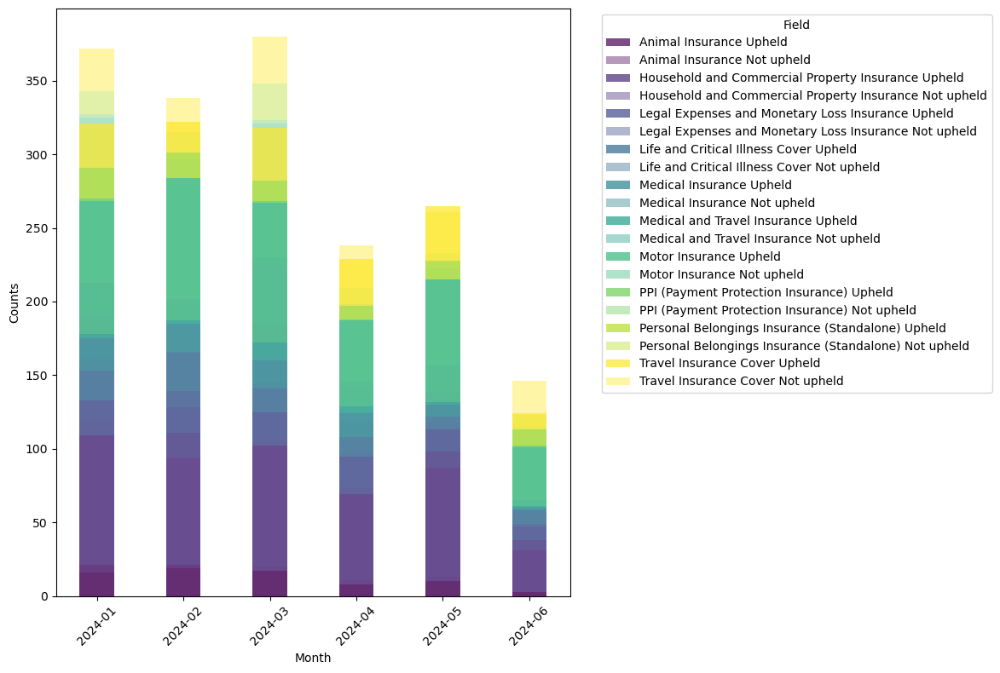

In [15]:
# Draw a stacked bar chart showing the number of "Upheld" and "Not upheld" decisions in different areas each month.
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

fields = field_monthly_decision.index.get_level_values(1).unique()
colors = plt.cm.viridis(np.linspace(0, 1, len(fields)))

fig, ax = plt.subplots(figsize=(12, 8))

total_months = field_monthly_decision.index.get_level_values(0).unique()
bottom_upheld = np.zeros(len(total_months))
bottom_not_upheld = np.zeros(len(total_months))

for i, field in enumerate(fields):
    data = field_monthly_decision.xs(field, level='field')

    if len(data) != len(bottom_upheld):
        upheld_padded = np.zeros(len(total_months))
        not_upheld_padded = np.zeros(len(total_months))
        indices = [total_months.get_loc(month) for month in data.index]
        upheld_padded[indices] = data['Upheld']
        not_upheld_padded[indices] = data['Not upheld']
    else:
        upheld_padded = data['Upheld']
        not_upheld_padded = data['Not upheld']
    
    ax.bar(total_months.astype(str), upheld_padded, bottom=bottom_upheld, label=f'{field} Upheld', color=colors[i], alpha=0.7, width=0.4)
    ax.bar(total_months.astype(str), not_upheld_padded, bottom=bottom_not_upheld, label=f'{field} Not upheld', color=colors[i], alpha=0.4, width=0.4)
    
    bottom_upheld += upheld_padded
    bottom_not_upheld += not_upheld_padded

ax.set_ylabel('Counts')
ax.set_xlabel('Month')
ax.legend(title='Field', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


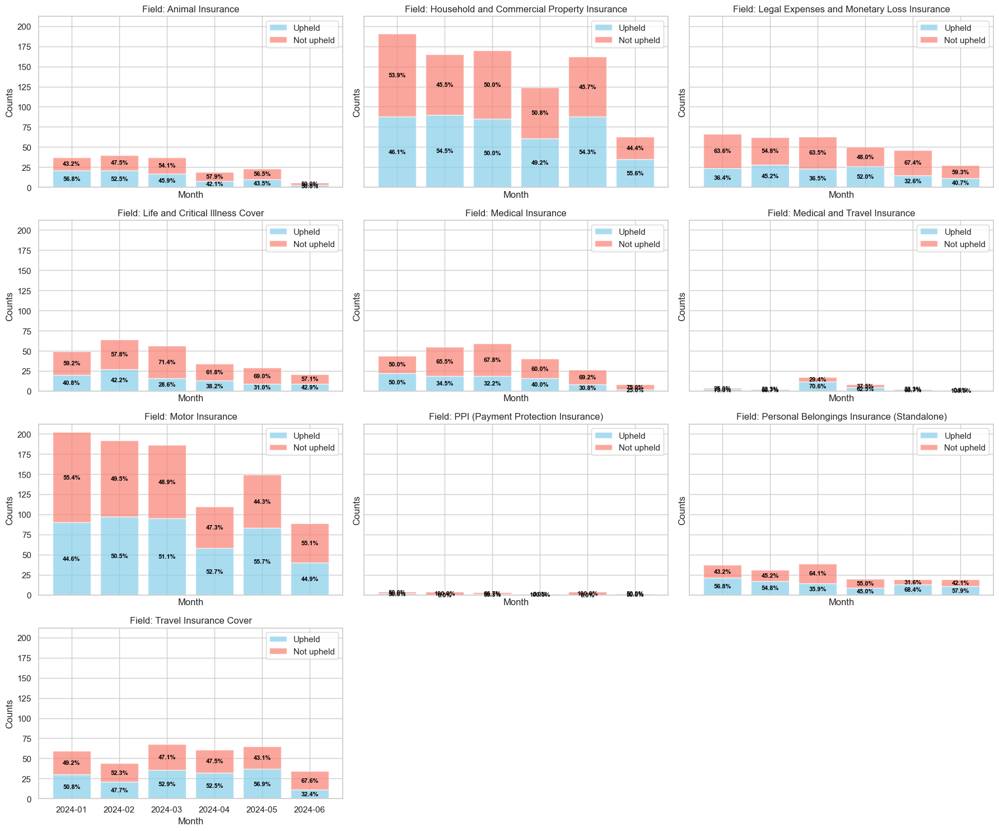

In [17]:
### For each type of insurance, look at the relationship between its month and the number of complaints and approval ratings
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

sns.set(style="whitegrid")

fields = field_monthly_decision.index.get_level_values(1).unique()
colors = ['skyblue', 'salmon']

fig, axes = plt.subplots(4, 3, figsize=(18, 15), sharex=True, sharey=True)
axes = axes.flatten()

for i, field in enumerate(fields):
    ax = axes[i]
    data = field_monthly_decision.xs(field, level='field')
    
    bars_upheld = ax.bar(data.index.astype(str), data['Upheld'], label='Upheld', color=colors[0], alpha=0.7)
    bars_not_upheld = ax.bar(data.index.astype(str), data['Not upheld'], bottom=data['Upheld'], label='Not upheld', color=colors[1], alpha=0.7)
    
    for bar_u, bar_nu, upheld, not_upheld in zip(bars_upheld, bars_not_upheld, data['Upheld'], data['Not upheld']):
        total = upheld + not_upheld
        percentage_upheld = f"{upheld / total * 100:.1f}%"
        percentage_not_upheld = f"{not_upheld / total * 100:.1f}%"
        ax.text(bar_u.get_x() + bar_u.get_width() / 2, upheld / 2, percentage_upheld, ha='center', va='center', color='black', fontweight='bold', fontsize=8)
        ax.text(bar_nu.get_x() + bar_nu.get_width() / 2, upheld + not_upheld / 2, percentage_not_upheld, ha='center', va='center', color='black', fontweight='bold', fontsize=8)
    
    ax.set_title(f'Field: {field}')
    ax.set_xlabel('Month')
    ax.set_ylabel('Counts')
    ax.legend()

# Hide unwanted subgraphs
for j in range(10, 12):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('D:/dissertation/session 2/paper/month_field.png')
plt.show()


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


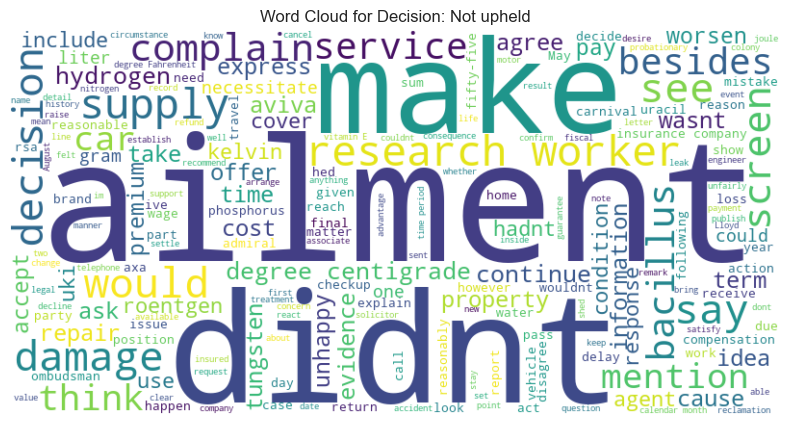

Top 100 Word Frequencies for Not upheld: [('ailment', 6397), ('didnt', 5019), ('make', 3474), ('research worker', 3232), ('supply', 3227), ('see', 3076), ('would', 3029), ('decision', 3014), ('damage', 3010), ('say', 2947), ('screen', 2654), ('complain', 2618), ('bacillus', 2504), ('besides', 2382), ('service', 2341), ('think', 2258), ('car', 2143), ('mention', 2115), ('degree centigrade', 1976), ('hydrogen', 1959), ('continue', 1938), ('wasnt', 1816), ('ask', 1814), ('repair', 1764), ('agree', 1747), ('idea', 1717), ('offer', 1667), ('cause', 1643), ('property', 1584), ('term', 1566), ('evidence', 1564), ('time', 1537), ('take', 1514), ('information', 1503), ('express', 1492), ('tungsten', 1490), ('cost', 1489), ('aviva', 1470), ('premium', 1406), ('accept', 1404), ('unhappy', 1368), ('pay', 1364), ('worsen', 1340), ('roentgen', 1308), ('include', 1306), ('condition', 1270), ('use', 1267), ('hadnt', 1263), ('agent', 1227), ('uki', 1204), ('response', 1202), ('kelvin', 1195), ('cover',

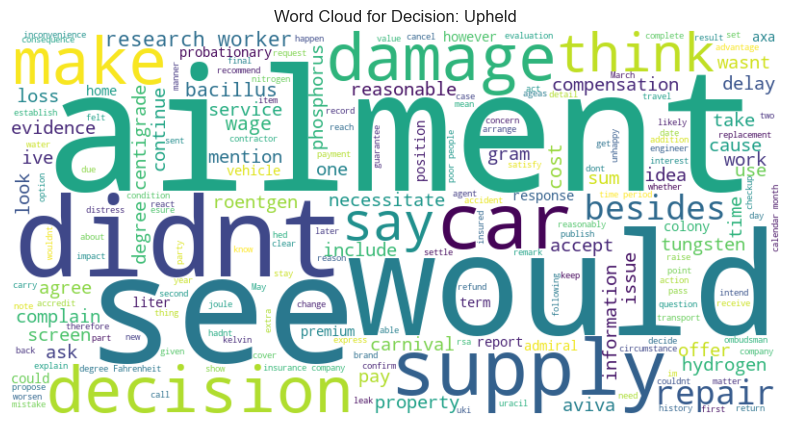

Top 100 Word Frequencies for Upheld: [('ailment', 7250), ('see', 5619), ('would', 5415), ('didnt', 4888), ('supply', 4860), ('car', 4838), ('damage', 4507), ('make', 4475), ('decision', 4375), ('think', 4329), ('say', 4229), ('repair', 4144), ('besides', 4077), ('research worker', 3932), ('bacillus', 3617), ('wage', 3504), ('cost', 3414), ('cause', 3078), ('screen', 3077), ('compensation', 3040), ('offer', 2979), ('service', 2830), ('sum', 2713), ('agree', 2618), ('accept', 2609), ('degree centigrade', 2589), ('complain', 2578), ('work', 2570), ('property', 2502), ('time', 2430), ('roentgen', 2351), ('mention', 2314), ('carnival', 2293), ('ask', 2287), ('pay', 2266), ('evidence', 2264), ('idea', 2261), ('necessitate', 2230), ('hydrogen', 2205), ('delay', 2183), ('loss', 2161), ('wasnt', 2146), ('continue', 2123), ('reasonable', 2119), ('tungsten', 2030), ('use', 2029), ('phosphorus', 2025), ('ive', 2003), ('one', 1993), ('issue', 1939), ('take', 1930), ('gram', 1873), ('look', 1870), (

In [18]:
##################### View word frequencies and word clouds for different decisions
!pip install pandas PyPDF2 matplotlib wordcloud
import re
import nltk
import fitz  # PyMuPDF
from nltk.corpus import wordnet as wn
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

def extract_what_happened(pdf_path):
    text = ""
    with fitz.open(pdf_path) as doc:
        for page in doc:
            text += page.get_text()
     
    complaint_pattern = r'The complaint\s*((?:[\s\S](?!What happened))*.)'
    complaint_match = re.search(complaint_pattern, text)
    
    happened_pattern = r'What happened\s*([\s\S]*?)(?=What I’ve decided – and why|What I provisionally said|What I provisionally decided – and why)'
    happened_match = re.search(happened_pattern, text)
    
    complaint_text = complaint_match.group(1).strip() if complaint_match else ""
    happened_text = happened_match.group(1).strip() if happened_match else ""
    
    combined_text = complaint_text + " " + happened_text
    
    return combined_text

# Extended abbreviation
def expand_contractions(text):
    # Define a mapping dictionary of abbreviations and full forms
    contractions_dict = {
        "n't": " not",
        "'re": " are",
        "'s": " is",
        "'d": " would",
        "'ll": " will",
        "'t": " not",
        "'ve": " have",
        "'m": " am"
    }
    
    contractions_re = re.compile('(%s)' % '|'.join(contractions_dict.keys()))

    def replace(match):
        return contractions_dict[match.group(0)]

    return contractions_re.sub(replace, text)


# Get synonyms of words
def get_synonym(word, pos=None):
    synsets = wn.synsets(word, pos=pos)
    if not synsets:
        return word
    synonym = synsets[0].lemmas()[0].name()
    return synonym.replace('_', ' ')


# Text preprocessing
def preprocess_text(text):
    text = text.lower()
    text = expand_contractions(text)
    text = re.sub(r'[^a-z\s]', '', text)
    text = re.sub(r'\b(Mr|Mrs|Ms|Mx|Miss|Dr|Prof)\b', '', text, flags=re.IGNORECASE)
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    processed_tokens = [get_synonym(lemmatizer.lemmatize(word)) for word in tokens if word not in stop_words]
    processed_tokens = [word for word in processed_tokens if word not in ['insurance', 'policy', 'claim', 'state', ]]
    processed_tokens = ' '.join(processed_tokens)
    return processed_tokens

df = pd.read_csv('D:/dissertation/session 2/merged_output.csv')
base_path = 'D:/dissertation/session 2/decisions_half'

# Process text for different decisions separately
decision_categories = df['decision'].unique()

for decision in decision_categories:
    category_text = []
    subset = df[df['decision'] == decision]
    
    for decision_id in subset['decision_id']:
        pdf_path = f'{base_path}/{decision_id}.pdf'
        try:
            raw_text = extract_what_happened(pdf_path)
            cleaned_tokens = preprocess_text(raw_text)
            category_text.extend(cleaned_tokens)
        except Exception as e:
            print(f"Error processing file {pdf_path}: {str(e)}")
    
    # Word frequency statistics
    word_counts = Counter(category_text)
    top_100_words = word_counts.most_common(100)
    
    # Generating word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Decision: {decision}')
    plt.axis('off')
    plt.show()

    # Print the first 100 words of the word frequency statistics
    print(f"Top 100 Word Frequencies for {decision}:", top_100_words)
   

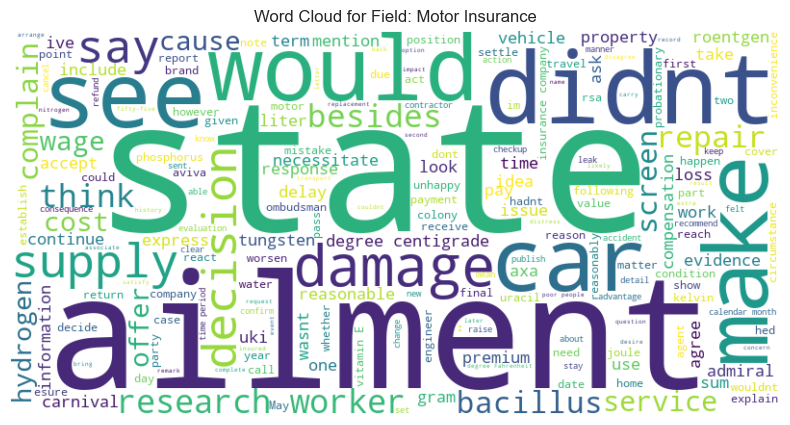

Top 100 Word Frequencies for Motor Insurance: [('state', 6210), ('ailment', 4402), ('didnt', 3291), ('see', 2827), ('would', 2772), ('make', 2658), ('car', 2648), ('damage', 2510), ('supply', 2469), ('decision', 2462), ('say', 2314), ('research worker', 2296), ('think', 2183), ('besides', 2171), ('repair', 1996), ('bacillus', 1822), ('screen', 1749), ('complain', 1745), ('service', 1628), ('cause', 1565), ('offer', 1559), ('cost', 1552), ('wage', 1541), ('hydrogen', 1432), ('degree centigrade', 1428), ('mention', 1417), ('idea', 1381), ('agree', 1357), ('wasnt', 1350), ('continue', 1340), ('ask', 1336), ('compensation', 1302), ('time', 1243), ('property', 1231), ('accept', 1220), ('pay', 1202), ('evidence', 1173), ('sum', 1157), ('roentgen', 1149), ('take', 1137), ('carnival', 1107), ('necessitate', 1094), ('tungsten', 1094), ('work', 1091), ('loss', 1083), ('use', 1072), ('reasonable', 1072), ('delay', 1048), ('uki', 1032), ('admiral', 1015), ('gram', 1012), ('term', 1005), ('vehicle'

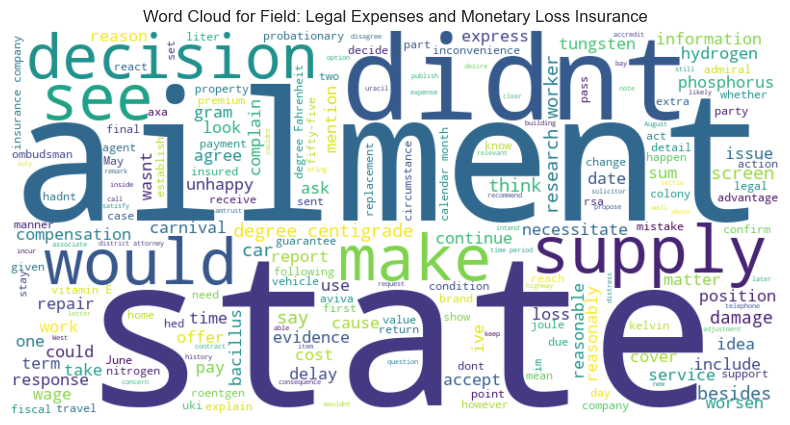

Top 100 Word Frequencies for Legal Expenses and Monetary Loss Insurance: [('state', 1266), ('ailment', 881), ('didnt', 647), ('supply', 617), ('make', 575), ('would', 569), ('see', 556), ('decision', 526), ('degree centigrade', 477), ('say', 471), ('research worker', 452), ('think', 446), ('screen', 426), ('car', 412), ('besides', 410), ('damage', 388), ('cost', 352), ('bacillus', 335), ('service', 329), ('agree', 328), ('complain', 319), ('repair', 317), ('wage', 308), ('mention', 297), ('continue', 290), ('hydrogen', 289), ('phosphorus', 281), ('compensation', 272), ('accept', 271), ('term', 270), ('ask', 269), ('offer', 269), ('wasnt', 264), ('time', 264), ('idea', 263), ('loss', 255), ('tungsten', 255), ('necessitate', 253), ('sum', 251), ('work', 248), ('cause', 247), ('reasonable', 235), ('one', 232), ('take', 231), ('use', 230), ('could', 223), ('include', 214), ('evidence', 212), ('information', 209), ('issue', 204), ('report', 201), ('ive', 199), ('response', 199), ('gram', 19

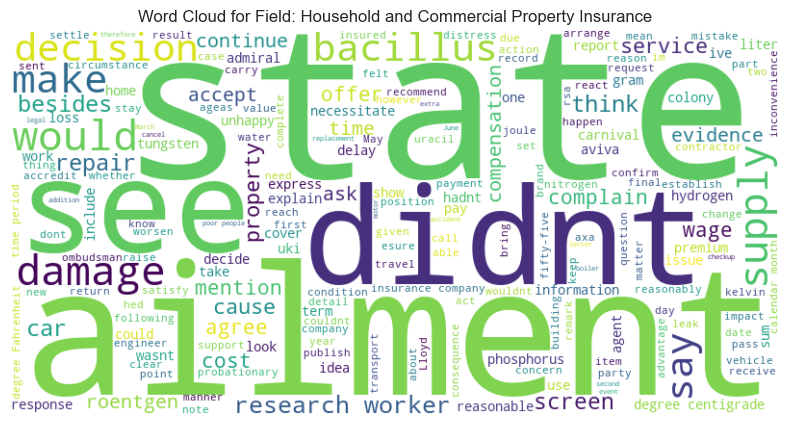

Top 100 Word Frequencies for Household and Commercial Property Insurance: [('state', 6596), ('ailment', 4609), ('didnt', 3302), ('see', 3070), ('damage', 2866), ('would', 2847), ('supply', 2728), ('make', 2641), ('say', 2494), ('bacillus', 2466), ('decision', 2417), ('research worker', 2401), ('car', 2246), ('besides', 2234), ('repair', 2202), ('think', 2151), ('screen', 1941), ('service', 1828), ('property', 1793), ('cause', 1774), ('complain', 1684), ('cost', 1667), ('offer', 1607), ('mention', 1543), ('wage', 1535), ('agree', 1534), ('compensation', 1410), ('accept', 1406), ('evidence', 1392), ('ask', 1392), ('roentgen', 1387), ('continue', 1355), ('time', 1335), ('degree centigrade', 1332), ('idea', 1327), ('work', 1310), ('aviva', 1293), ('sum', 1283), ('wasnt', 1281), ('tungsten', 1233), ('necessitate', 1213), ('pay', 1175), ('information', 1144), ('take', 1128), ('include', 1108), ('carnival', 1100), ('use', 1086), ('phosphorus', 1086), ('loss', 1069), ('home', 1066), ('reasonab

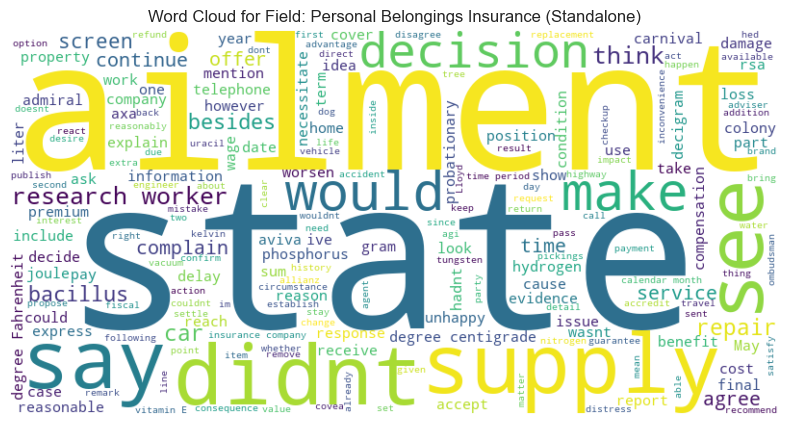

Top 100 Word Frequencies for Personal Belongings Insurance (Standalone): [('state', 684), ('ailment', 551), ('supply', 339), ('didnt', 338), ('say', 325), ('see', 312), ('would', 305), ('make', 302), ('decision', 293), ('research worker', 284), ('think', 277), ('repair', 234), ('car', 233), ('besides', 218), ('bacillus', 214), ('screen', 203), ('agree', 188), ('offer', 181), ('complain', 180), ('service', 177), ('time', 169), ('continue', 167), ('degree centigrade', 167), ('sum', 166), ('damage', 166), ('one', 165), ('gram', 165), ('wage', 164), ('evidence', 164), ('cause', 164), ('phosphorus', 163), ('term', 163), ('accept', 161), ('mention', 156), ('degree Fahrenheit', 153), ('information', 144), ('cost', 143), ('ask', 142), ('compensation', 142), ('idea', 142), ('telephone', 141), ('loss', 140), ('axa', 136), ('take', 132), ('property', 131), ('position', 125), ('carnival', 123), ('include', 119), ('reasonable', 119), ('use', 118), ('wasnt', 118), ('delay', 118), ('liter', 118), ('p

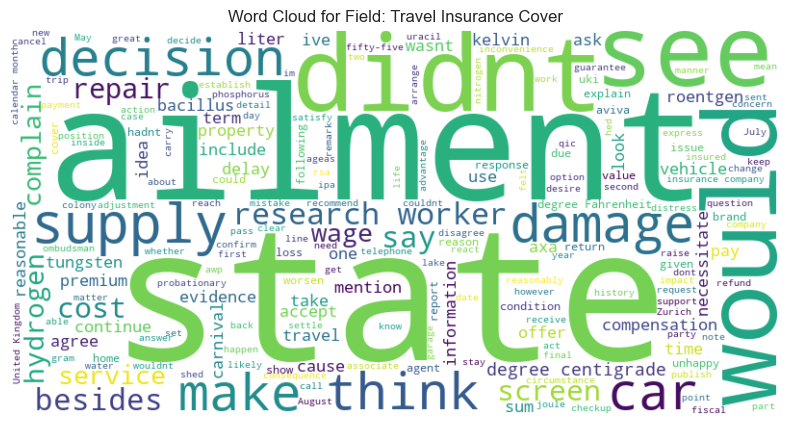

Top 100 Word Frequencies for Travel Insurance Cover: [('state', 1914), ('ailment', 1303), ('didnt', 937), ('would', 874), ('see', 860), ('supply', 842), ('damage', 754), ('think', 730), ('decision', 727), ('make', 720), ('car', 707), ('research worker', 688), ('say', 649), ('besides', 646), ('cost', 619), ('screen', 608), ('repair', 584), ('hydrogen', 551), ('service', 520), ('complain', 502), ('wage', 489), ('degree centigrade', 476), ('offer', 449), ('bacillus', 448), ('compensation', 433), ('roentgen', 431), ('vehicle', 417), ('ask', 416), ('time', 416), ('term', 412), ('pay', 411), ('axa', 410), ('use', 409), ('mention', 408), ('wasnt', 403), ('cause', 400), ('sum', 395), ('agree', 394), ('evidence', 394), ('carnival', 393), ('accept', 384), ('liter', 383), ('ive', 376), ('tungsten', 360), ('continue', 357), ('information', 352), ('one', 351), ('idea', 348), ('include', 344), ('look', 337), ('travel', 329), ('necessitate', 329), ('reasonable', 328), ('take', 327), ('kelvin', 326), 

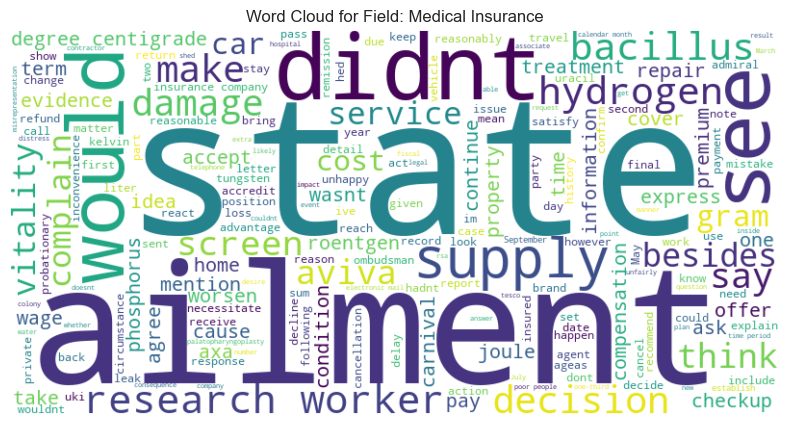

Top 100 Word Frequencies for Medical Insurance: [('state', 913), ('ailment', 653), ('didnt', 502), ('see', 392), ('would', 368), ('supply', 365), ('research worker', 363), ('bacillus', 346), ('hydrogen', 346), ('make', 335), ('decision', 332), ('damage', 318), ('say', 304), ('screen', 290), ('think', 277), ('aviva', 272), ('besides', 262), ('vitality', 250), ('service', 250), ('complain', 247), ('gram', 224), ('car', 223), ('cost', 211), ('degree centigrade', 210), ('accept', 209), ('ask', 204), ('time', 199), ('compensation', 198), ('roentgen', 198), ('mention', 196), ('wage', 196), ('agree', 194), ('checkup', 186), ('wasnt', 186), ('cause', 184), ('offer', 182), ('worsen', 181), ('pay', 177), ('axa', 176), ('term', 174), ('phosphorus', 174), ('evidence', 173), ('information', 172), ('repair', 172), ('continue', 171), ('express', 167), ('property', 166), ('take', 160), ('one', 153), ('joule', 152), ('condition', 151), ('premium', 149), ('idea', 149), ('cover', 147), ('home', 145), ('t

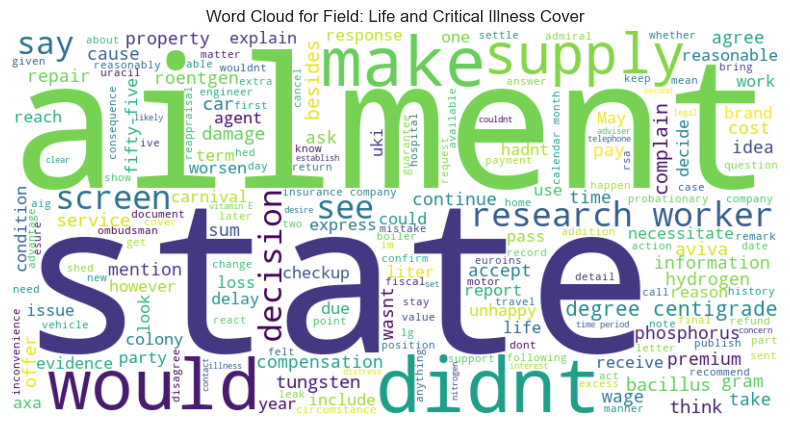

Top 100 Word Frequencies for Life and Critical Illness Cover: [('state', 972), ('ailment', 718), ('didnt', 502), ('would', 424), ('make', 404), ('supply', 398), ('research worker', 377), ('see', 353), ('screen', 352), ('decision', 340), ('say', 336), ('degree centigrade', 333), ('complain', 308), ('besides', 295), ('bacillus', 279), ('think', 276), ('tungsten', 274), ('service', 268), ('aviva', 257), ('damage', 249), ('offer', 246), ('car', 244), ('pay', 230), ('continue', 225), ('mention', 224), ('hydrogen', 223), ('phosphorus', 219), ('premium', 218), ('repair', 218), ('ask', 212), ('roentgen', 210), ('cause', 209), ('agree', 208), ('compensation', 205), ('idea', 205), ('gram', 204), ('information', 202), ('accept', 198), ('sum', 195), ('wage', 193), ('cost', 192), ('take', 191), ('wasnt', 191), ('property', 189), ('time', 187), ('term', 175), ('could', 172), ('include', 172), ('express', 167), ('axa', 165), ('evidence', 165), ('checkup', 164), ('hadnt', 164), ('necessitate', 158), (

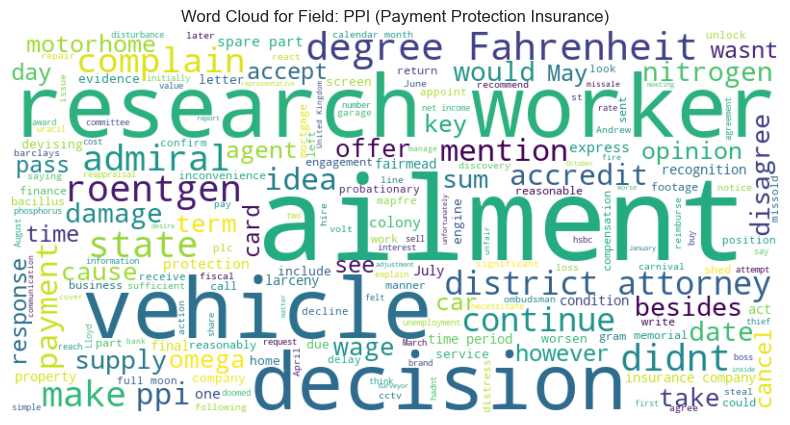

Top 100 Word Frequencies for PPI (Payment Protection Insurance): [('ailment', 59), ('research worker', 41), ('vehicle', 39), ('decision', 34), ('degree Fahrenheit', 29), ('didnt', 26), ('state', 26), ('roentgen', 26), ('make', 25), ('admiral', 25), ('complain', 24), ('continue', 22), ('district attorney', 22), ('idea', 19), ('mention', 19), ('payment', 18), ('ppi', 18), ('accredit', 17), ('would', 15), ('nitrogen', 15), ('damage', 15), ('date', 15), ('disagree', 14), ('besides', 14), ('supply', 14), ('sum', 14), ('wage', 13), ('term', 13), ('cause', 13), ('take', 13), ('offer', 13), ('omega', 13), ('opinion', 12), ('agent', 12), ('key', 12), ('car', 12), ('motorhome', 12), ('response', 11), ('however', 11), ('cancel', 11), ('pass', 11), ('day', 11), ('time', 11), ('see', 11), ('accept', 11), ('May', 11), ('wasnt', 11), ('card', 10), ('protection', 10), ('colony', 10), ('one', 10), ('express', 10), ('spare part', 10), ('recognition', 9), ('final', 9), ('act', 9), ('property', 9), ('July

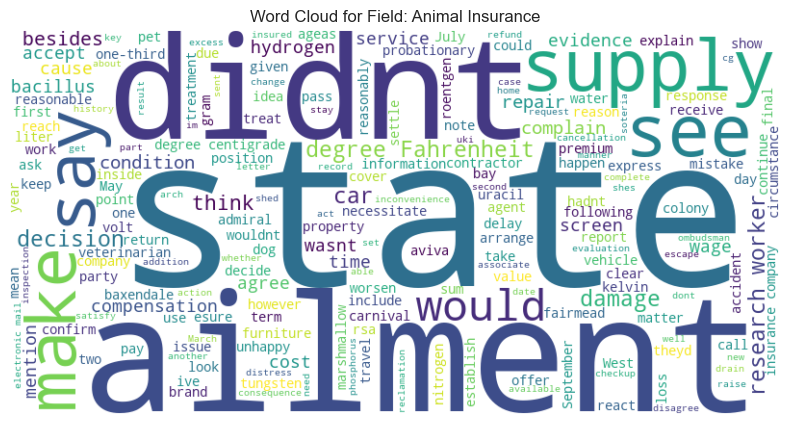

Top 100 Word Frequencies for Animal Insurance: [('state', 681), ('ailment', 451), ('didnt', 344), ('supply', 306), ('see', 304), ('make', 277), ('say', 274), ('would', 265), ('degree Fahrenheit', 263), ('car', 256), ('research worker', 255), ('decision', 251), ('damage', 251), ('think', 218), ('besides', 202), ('complain', 180), ('repair', 177), ('condition', 176), ('bacillus', 166), ('wage', 165), ('cause', 164), ('mention', 163), ('service', 160), ('compensation', 157), ('agree', 155), ('wasnt', 155), ('cost', 153), ('hydrogen', 149), ('accept', 145), ('screen', 144), ('evidence', 143), ('time', 141), ('degree centigrade', 140), ('idea', 140), ('offer', 136), ('sum', 131), ('carnival', 130), ('continue', 129), ('pay', 129), ('term', 126), ('veterinarian', 124), ('ask', 123), ('dog', 122), ('furniture', 122), ('take', 115), ('work', 115), ('one', 112), ('loss', 112), ('party', 110), ('tungsten', 110), ('necessitate', 109), ('insurance company', 109), ('use', 109), ('pet', 107), ('vehi

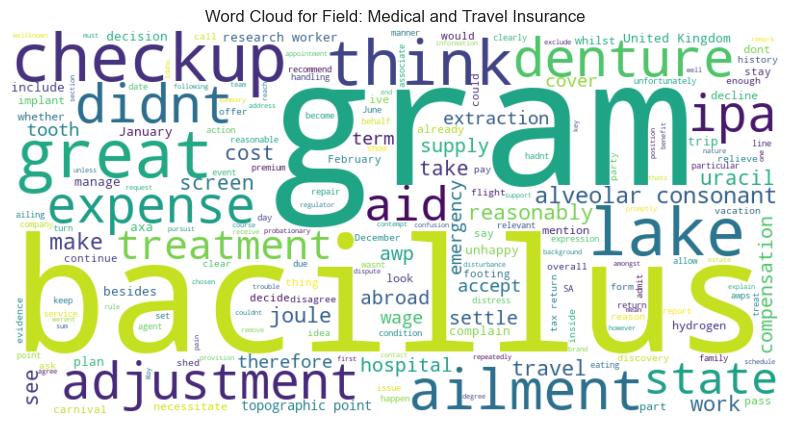

Top 100 Word Frequencies for Medical and Travel Insurance: [('gram', 49), ('bacillus', 38), ('checkup', 28), ('great', 28), ('lake', 28), ('think', 25), ('ailment', 20), ('didnt', 18), ('denture', 18), ('expense', 16), ('adjustment', 16), ('ipa', 16), ('aid', 14), ('state', 13), ('treatment', 13), ('alveolar consonant', 13), ('make', 12), ('joule', 11), ('travel', 11), ('reasonably', 11), ('work', 11), ('cost', 10), ('uracil', 10), ('take', 10), ('see', 10), ('screen', 10), ('awp', 9), ('abroad', 9), ('hospital', 9), ('supply', 9), ('settle', 9), ('compensation', 9), ('therefore', 8), ('wage', 8), ('tooth', 8), ('extraction', 8), ('cover', 8), ('term', 8), ('accept', 8), ('emergency', 8), ('topographic point', 8), ('complain', 7), ('manage', 7), ('include', 7), ('January', 7), ('United Kingdom', 7), ('unhappy', 7), ('research worker', 7), ('decision', 7), ('besides', 7), ('trip', 7), ('plan', 7), ('axa', 7), ('mention', 6), ('ive', 6), ('pass', 6), ('necessitate', 6), ('implant', 6), (

In [57]:
##################### View word frequencies and word clouds for different insurance fields
# Handle different fields of text separately
field_categories = df['field'].unique()

for field in field_categories:
    category_text = []
    subset = df[df['field'] == field]
    
    for decision_id in subset['decision_id']:
        pdf_path = f'{base_path}/{decision_id}.pdf'
        try:
            raw_text = extract_what_happened(pdf_path)
            cleaned_tokens = preprocess_text(raw_text)
            category_text.extend(cleaned_tokens)
        except Exception as e:
            print(f"Error processing file {pdf_path}: {str(e)}")
    
    word_counts = Counter(category_text)
    top_100_words = word_counts.most_common(100)
    
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)
    
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Field: {field}')
    plt.axis('off')
    plt.show()

    print(f"Top 100 Word Frequencies for {field}:", top_100_words)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


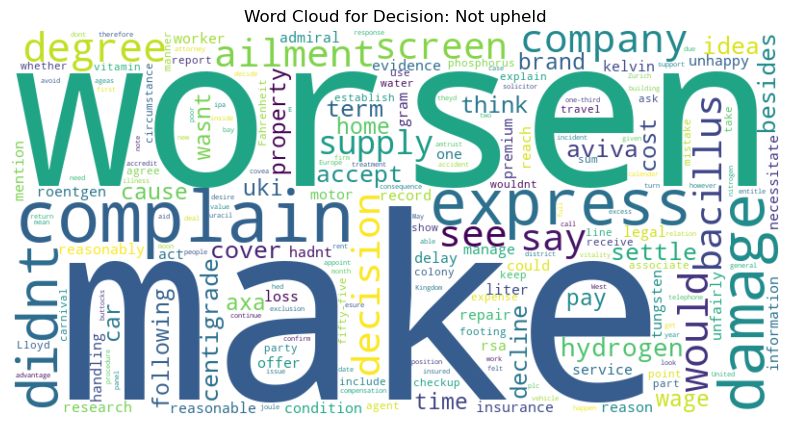

Top 100 Word Frequencies for Not upheld: [('make', 1793), ('worsen', 1172), ('complain', 1163), ('express', 877), ('damage', 848), ('didnt', 690), ('degree', 664), ('would', 655), ('company', 624), ('ailment', 593), ('decision', 593), ('see', 587), ('say', 555), ('bacillus', 554), ('screen', 537), ('supply', 524), ('hydrogen', 504), ('cover', 472), ('aviva', 469), ('centigrade', 451), ('settle', 448), ('besides', 448), ('term', 445), ('idea', 435), ('accept', 434), ('cost', 416), ('think', 415), ('decline', 411), ('wasnt', 391), ('home', 385), ('car', 383), ('axa', 383), ('time', 378), ('uki', 377), ('pay', 368), ('property', 366), ('following', 364), ('wage', 361), ('cause', 359), ('brand', 355), ('reasonably', 355), ('legal', 342), ('condition', 341), ('roentgen', 337), ('repair', 332), ('delay', 332), ('unhappy', 329), ('loss', 327), ('tungsten', 326), ('insurance', 320), ('research', 320), ('worker', 316), ('information', 312), ('unfairly', 308), ('kelvin', 305), ('hadnt', 303), ('

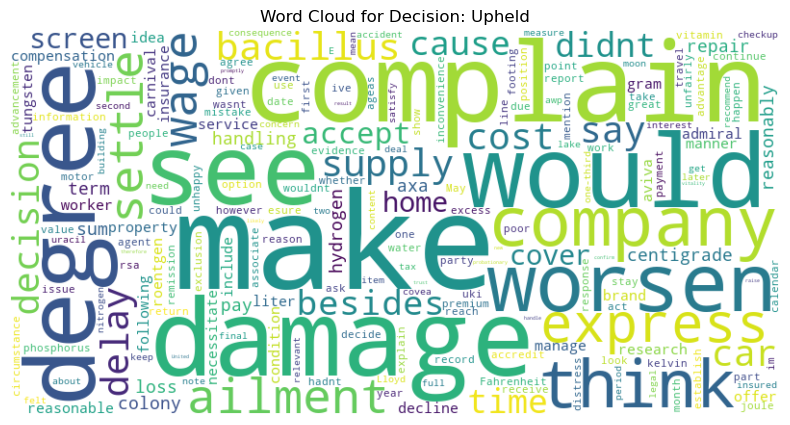

Top 100 Word Frequencies for Upheld: [('make', 2081), ('complain', 1301), ('damage', 1229), ('would', 1089), ('see', 1048), ('degree', 982), ('worsen', 921), ('company', 918), ('think', 878), ('express', 864), ('ailment', 836), ('wage', 827), ('settle', 817), ('bacillus', 793), ('supply', 792), ('delay', 792), ('cost', 760), ('car', 758), ('decision', 754), ('say', 751), ('besides', 732), ('didnt', 709), ('cause', 706), ('time', 695), ('accept', 678), ('screen', 606), ('cover', 592), ('home', 591), ('centigrade', 582), ('handling', 580), ('repair', 579), ('term', 577), ('pay', 576), ('axa', 566), ('loss', 565), ('sum', 559), ('colony', 539), ('reasonably', 532), ('hydrogen', 524), ('compensation', 505), ('manner', 495), ('insurance', 489), ('property', 488), ('manage', 488), ('research', 483), ('worker', 475), ('offer', 472), ('gram', 468), ('roentgen', 458), ('tungsten', 450), ('reasonable', 449), ('following', 446), ('service', 446), ('idea', 436), ('aviva', 434), ('admiral', 430), (

In [10]:
############################ Use the complaint text to view word frequencies and word clouds for different decisions
!pip install pandas PyPDF2 matplotlib wordcloud PyMuPDF
import re
import nltk
import fitz  # PyMuPDF
import pandas as pd
from nltk.corpus import wordnet as wn
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

def extract_text_and_claims(pdf_path, keyword):
    text = ""
    with fitz.open(pdf_path) as doc:
        for page in doc:
            text += page.get_text()

    complaint_pattern = r'The complaint\s*((?:[\s\S](?!What happened))*.)'
    complaint_match = re.search(complaint_pattern, text)
   
    happened_pattern = r'What happened\s*([\s\S]*?)(?=What I’ve decided – and why|What I provisionally said|What I provisionally decided – and why)'
    happened_match = re.search(happened_pattern, text)
    
    complaint_text = complaint_match.group(1).strip() if complaint_match else ""
    happened_text = happened_match.group(1).strip() if happened_match else ""
    
    combined_text = complaint_text + " " + happened_text
    
    sentences = re.split(r'(?<=[.!?])\s+', combined_text)
    
    keyword_text = ' '.join([sentence for sentence in sentences if keyword.lower() in sentence.lower()])
    
    return keyword_text


def expand_contractions(text):
    contractions_dict = {
        "n't": " not",
        "'re": " are",
        "'s": " is",
        "'d": " would",
        "'ll": " will",
        "'t": " not",
        "'ve": " have",
        "'m": " am"
    }
    
    contractions_re = re.compile('(%s)' % '|'.join(contractions_dict.keys()))

    def replace(match):
        return contractions_dict[match.group(0)]

    return contractions_re.sub(replace, text)

def get_synonym(word, pos=None):
    synsets = wn.synsets(word, pos=pos)
    if not synsets:
        return word
    synonym = synsets[0].lemmas()[0].name()
    return synonym.replace('_', ' ')

def preprocess_text(text):
    text = text.lower()
    text = expand_contractions(text)
    text = re.sub(r'[^a-z\s]', '', text)
    text = re.sub(r'\b(Mr|Mrs|Ms|Mx|Miss|Dr|Prof)\b', '', text, flags=re.IGNORECASE)
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    processed_tokens = [get_synonym(lemmatizer.lemmatize(word)) for word in tokens if word not in stop_words]
    processed_tokens = [word for word in processed_tokens if word not in ['insurance', 'policy', 'claim', 'state', ]]
    processed_text = ' '.join(processed_tokens)
    return processed_text

df = pd.read_csv('D:/dissertation/session 2/merged_output.csv', encoding='ISO-8859-1')
base_path = 'D:/dissertation/session 2/decisions_half'

# Specifies the search for text sentences that contain claims
keyword = 'claim'

# Process the text of different decisions separately
decision_categories = df['decision'].unique()

for decision in decision_categories:
    all_text = ""
    subset = df[df['decision'] == decision]

    for decision_id in subset['decision_id']:
        pdf_path = f'{base_path}/{decision_id}.pdf'
        try:
            raw_text = extract_text_and_claims(pdf_path, keyword)
            processed_text = preprocess_text(raw_text)
            all_text += " " + processed_text
        except Exception as e:
            print(f"Error processing file {pdf_path}: {str(e)}")

    words = all_text.split()
    word_counts = Counter(words)
    top_100_words = word_counts.most_common(100)

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Decision: {decision}')
    plt.axis('off')
    plt.show()
    print(f"Top 100 Word Frequencies for {decision}:", top_100_words)

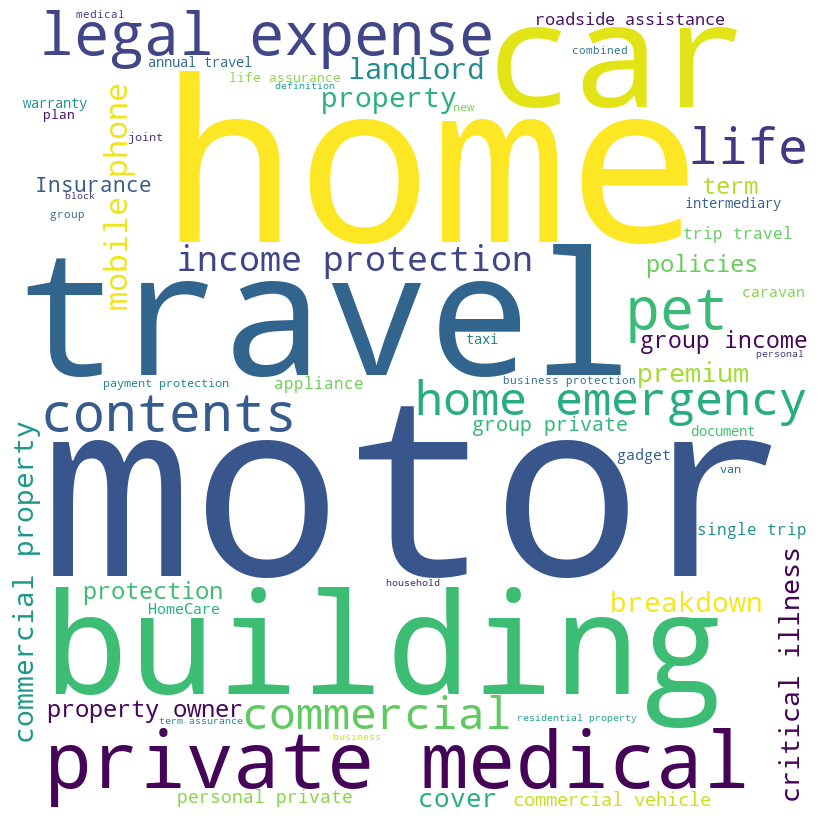

motor: 669
home: 601
travel: 306
car: 200
buildings: 175
medical: 116
private: 114
legal: 105
commercial: 105
expenses: 100
pet: 93
protection: 88
property: 85
life: 82
contents: 81
emergency: 66
and: 54
income: 53
group: 47
mobile: 45


In [9]:
############################# View word frequency and word cloud for products
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import re

df = pd.read_csv('D:/dissertation/session 2/merged_output.csv')

df.columns = df.columns.str.strip()

text = ' '.join(df['Product'].dropna().values)

wordcloud = WordCloud(width = 800, height = 800,
                      background_color ='white',
                      min_font_size = 10).generate(text)

wordcloud.to_file("D:/dissertation/session 2/paper/product_wordcloud.png")

plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

words = text.split()

word_counts = Counter(words)

top_20_words = word_counts.most_common(20)

for word, count in top_20_words:
    print(f"{word}: {count}")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\DELL\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


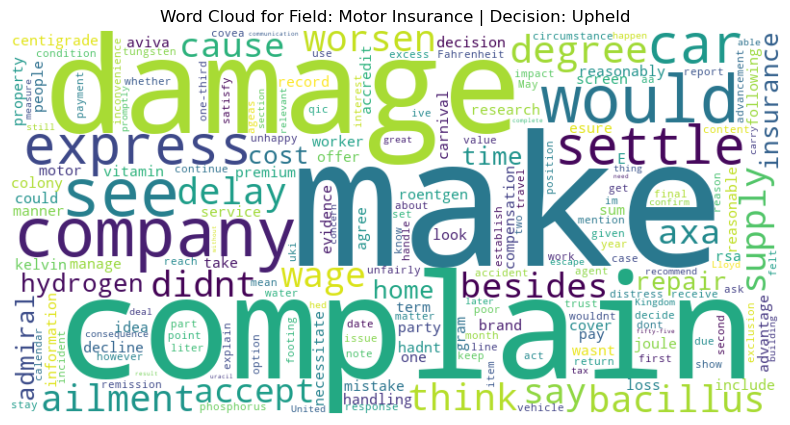

Top 50 Word Frequencies for Field: Motor Insurance | Decision: Upheld: [('make', 565), ('complain', 392), ('damage', 377), ('company', 283), ('would', 277), ('see', 276), ('express', 271), ('car', 270), ('settle', 257), ('degree', 252), ('bacillus', 224), ('delay', 220), ('think', 216), ('worsen', 216), ('ailment', 216), ('say', 209), ('wage', 207), ('didnt', 205), ('supply', 204), ('cause', 195), ('besides', 193), ('axa', 191), ('accept', 185), ('hydrogen', 184), ('cost', 177), ('home', 174), ('repair', 170), ('time', 166), ('insurance', 165), ('admiral', 165), ('centigrade', 165), ('manage', 164), ('decision', 163), ('reasonably', 157), ('cover', 156), ('handling', 156), ('loss', 151), ('compensation', 149), ('pay', 148), ('sum', 146), ('idea', 145), ('colony', 144), ('term', 137), ('roentgen', 133), ('esure', 133), ('manner', 132), ('motor', 132), ('following', 129), ('aviva', 128), ('decline', 127)]


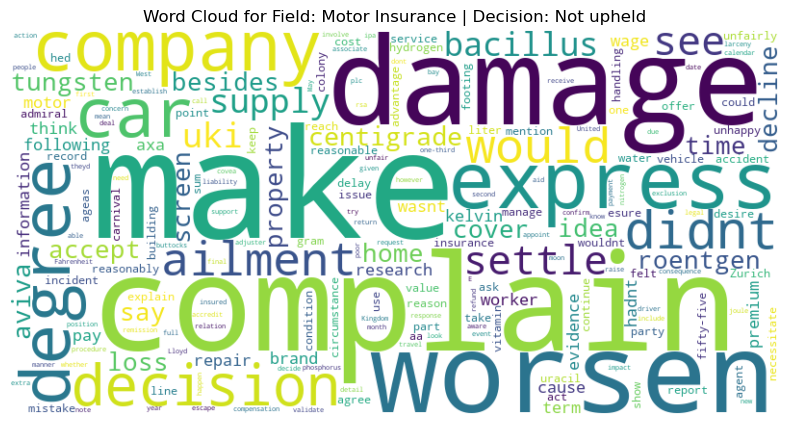

Top 50 Word Frequencies for Field: Motor Insurance | Decision: Not upheld: [('make', 429), ('complain', 333), ('damage', 267), ('worsen', 245), ('express', 236), ('company', 181), ('degree', 176), ('car', 172), ('decision', 170), ('didnt', 168), ('would', 163), ('ailment', 163), ('settle', 162), ('see', 160), ('supply', 145), ('uki', 143), ('bacillus', 138), ('centigrade', 134), ('cover', 128), ('accept', 128), ('aviva', 128), ('roentgen', 125), ('tungsten', 123), ('loss', 122), ('besides', 119), ('time', 117), ('say', 117), ('home', 115), ('screen', 114), ('idea', 113), ('property', 110), ('decline', 110), ('following', 108), ('axa', 104), ('motor', 103), ('brand', 102), ('wage', 100), ('wasnt', 99), ('cause', 97), ('pay', 96), ('term', 96), ('information', 95), ('repair', 93), ('think', 92), ('hadnt', 91), ('research', 90), ('worker', 90), ('kelvin', 90), ('evidence', 90), ('premium', 89)]


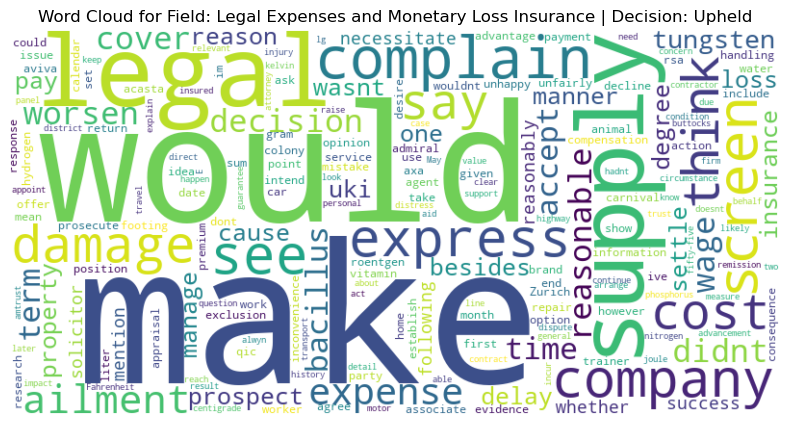

Top 50 Word Frequencies for Field: Legal Expenses and Monetary Loss Insurance | Decision: Upheld: [('make', 173), ('would', 120), ('legal', 116), ('supply', 100), ('complain', 98), ('screen', 93), ('see', 88), ('company', 85), ('express', 84), ('damage', 79), ('think', 79), ('cost', 74), ('say', 73), ('ailment', 73), ('expense', 69), ('decision', 67), ('wage', 66), ('didnt', 65), ('reasonable', 65), ('cover', 65), ('worsen', 64), ('accept', 62), ('bacillus', 61), ('time', 61), ('term', 61), ('tungsten', 61), ('prospect', 60), ('besides', 59), ('delay', 59), ('insurance', 57), ('cause', 55), ('property', 54), ('manner', 52), ('uki', 51), ('degree', 49), ('pay', 48), ('reason', 48), ('manage', 47), ('settle', 46), ('one', 45), ('wasnt', 45), ('loss', 45), ('necessitate', 45), ('mention', 45), ('success', 45), ('solicitor', 44), ('reasonably', 43), ('whether', 43), ('following', 42), ('compensation', 42)]


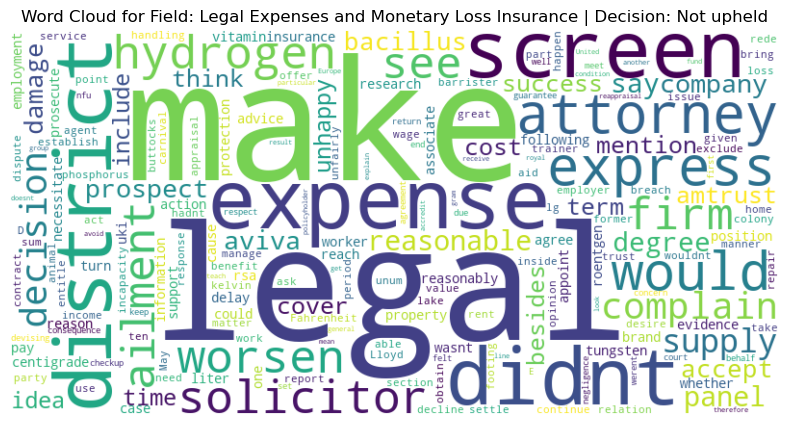

Top 50 Word Frequencies for Field: Legal Expenses and Monetary Loss Insurance | Decision: Not upheld: [('make', 281), ('legal', 254), ('expense', 158), ('screen', 147), ('didnt', 146), ('district', 145), ('attorney', 145), ('express', 139), ('would', 133), ('solicitor', 125), ('hydrogen', 125), ('worsen', 124), ('ailment', 119), ('firm', 113), ('see', 113), ('complain', 111), ('decision', 109), ('supply', 108), ('reasonable', 101), ('panel', 101), ('degree', 97), ('say', 95), ('prospect', 94), ('company', 94), ('aviva', 92), ('bacillus', 86), ('damage', 85), ('accept', 84), ('mention', 78), ('amtrust', 78), ('success', 77), ('term', 75), ('cost', 74), ('think', 74), ('cover', 74), ('besides', 72), ('time', 66), ('idea', 65), ('include', 63), ('unhappy', 61), ('centigrade', 60), ('rsa', 59), ('wasnt', 57), ('vitamin', 57), ('tungsten', 55), ('prosecute', 54), ('research', 53), ('reasonably', 53), ('uki', 52), ('liter', 52)]


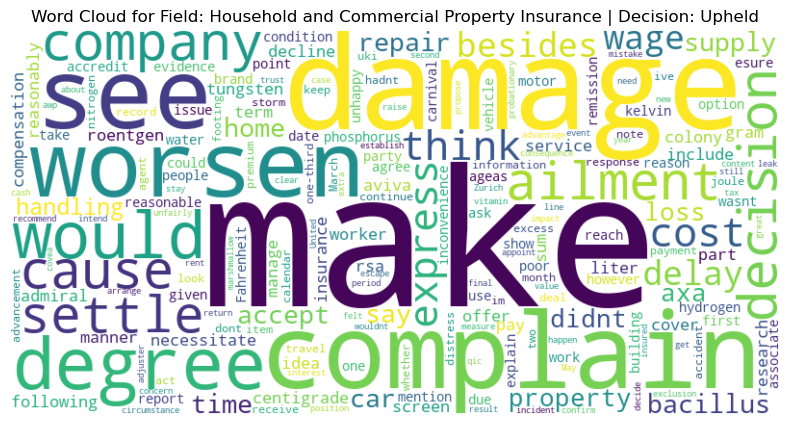

Top 50 Word Frequencies for Field: Household and Commercial Property Insurance | Decision: Upheld: [('make', 571), ('damage', 523), ('complain', 387), ('see', 339), ('worsen', 299), ('degree', 295), ('would', 284), ('company', 269), ('decision', 269), ('ailment', 256), ('cause', 256), ('settle', 249), ('think', 247), ('express', 243), ('cost', 240), ('delay', 232), ('besides', 231), ('wage', 229), ('repair', 228), ('supply', 225), ('bacillus', 224), ('time', 218), ('say', 215), ('car', 215), ('home', 213), ('accept', 206), ('property', 200), ('loss', 194), ('didnt', 190), ('axa', 187), ('handling', 180), ('centigrade', 170), ('colony', 167), ('cover', 163), ('offer', 161), ('manner', 157), ('rsa', 155), ('sum', 154), ('screen', 151), ('liter', 151), ('following', 150), ('compensation', 145), ('tungsten', 145), ('roentgen', 142), ('research', 141), ('pay', 141), ('reasonably', 139), ('service', 137), ('worker', 137), ('term', 136)]


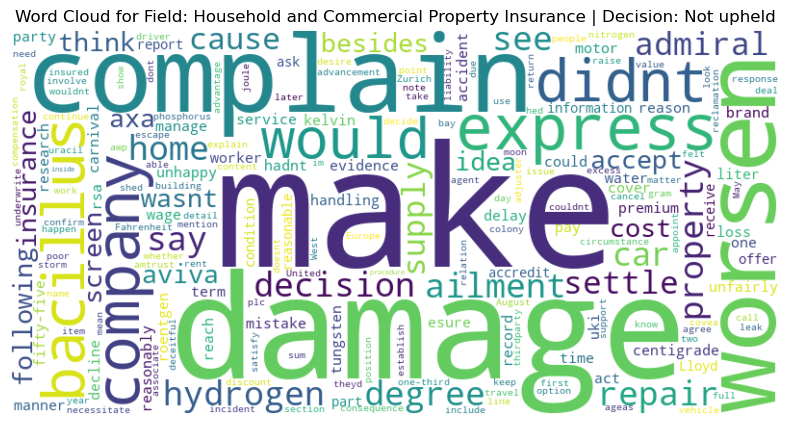

Top 50 Word Frequencies for Field: Household and Commercial Property Insurance | Decision: Not upheld: [('make', 444), ('damage', 328), ('complain', 311), ('worsen', 278), ('express', 200), ('company', 187), ('bacillus', 175), ('didnt', 171), ('would', 159), ('hydrogen', 155), ('degree', 154), ('ailment', 152), ('say', 150), ('property', 146), ('home', 142), ('see', 140), ('repair', 137), ('decision', 136), ('car', 132), ('admiral', 125), ('settle', 124), ('supply', 123), ('cause', 119), ('accept', 117), ('cost', 115), ('axa', 113), ('think', 112), ('insurance', 110), ('aviva', 110), ('idea', 110), ('following', 106), ('besides', 103), ('wasnt', 102), ('screen', 102), ('centigrade', 101), ('loss', 99), ('record', 98), ('rsa', 97), ('term', 96), ('decline', 95), ('cover', 94), ('wage', 91), ('reasonably', 89), ('time', 89), ('brand', 88), ('unfairly', 88), ('motor', 83), ('manage', 83), ('premium', 79), ('hadnt', 78)]


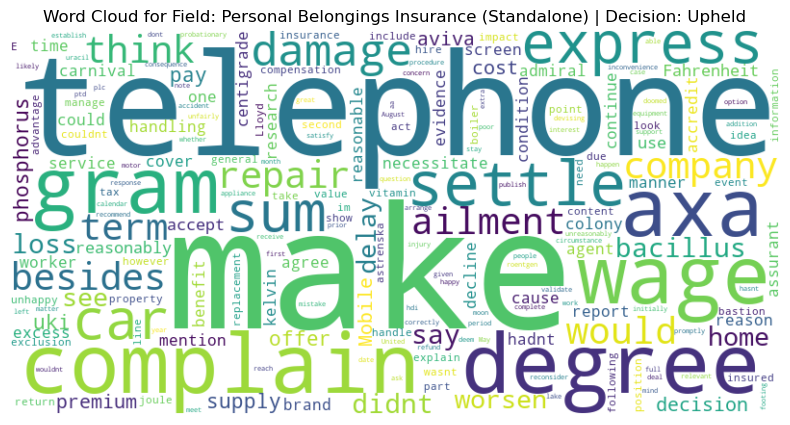

Top 50 Word Frequencies for Field: Personal Belongings Insurance (Standalone) | Decision: Upheld: [('make', 110), ('telephone', 75), ('complain', 65), ('degree', 65), ('wage', 62), ('axa', 61), ('gram', 58), ('settle', 56), ('express', 55), ('sum', 52), ('car', 51), ('damage', 51), ('besides', 50), ('think', 50), ('repair', 50), ('company', 49), ('term', 48), ('ailment', 46), ('would', 46), ('bacillus', 46), ('loss', 45), ('say', 44), ('didnt', 44), ('worsen', 42), ('home', 41), ('see', 40), ('delay', 40), ('supply', 39), ('uki', 38), ('offer', 37), ('pay', 37), ('phosphorus', 36), ('cost', 34), ('Mobile', 34), ('decision', 33), ('aviva', 33), ('premium', 32), ('reasonably', 32), ('Fahrenheit', 32), ('use', 31), ('accept', 31), ('necessitate', 29), ('centigrade', 29), ('excess', 28), ('cause', 27), ('handling', 27), ('cover', 27), ('carnival', 27), ('service', 26), ('screen', 26)]


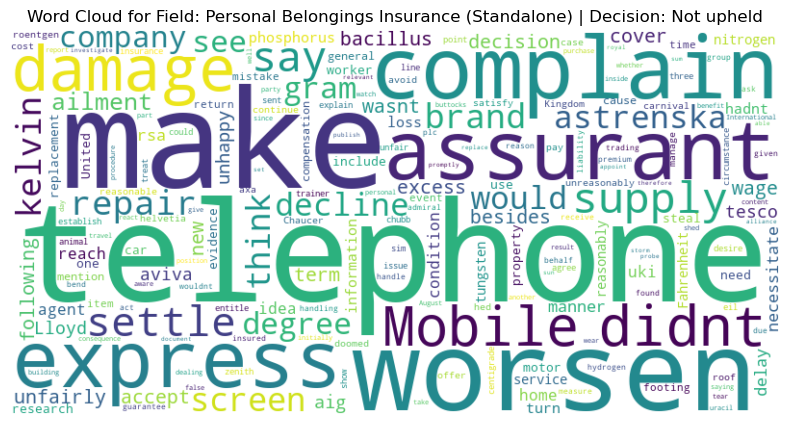

Top 50 Word Frequencies for Field: Personal Belongings Insurance (Standalone) | Decision: Not upheld: [('telephone', 91), ('make', 87), ('worsen', 55), ('complain', 50), ('assurant', 46), ('express', 43), ('damage', 40), ('didnt', 31), ('Mobile', 30), ('supply', 30), ('say', 29), ('settle', 28), ('repair', 28), ('brand', 27), ('kelvin', 27), ('think', 26), ('screen', 26), ('decline', 25), ('astrenska', 25), ('would', 25), ('degree', 23), ('see', 23), ('gram', 23), ('company', 22), ('ailment', 22), ('unfairly', 22), ('decision', 22), ('besides', 21), ('bacillus', 20), ('following', 20), ('accept', 20), ('wage', 20), ('excess', 20), ('new', 20), ('term', 19), ('cover', 19), ('wasnt', 19), ('unhappy', 18), ('aig', 18), ('Lloyd', 17), ('tesco', 17), ('aviva', 17), ('rsa', 16), ('necessitate', 16), ('delay', 16), ('manner', 16), ('home', 15), ('reach', 15), ('idea', 15), ('condition', 15)]


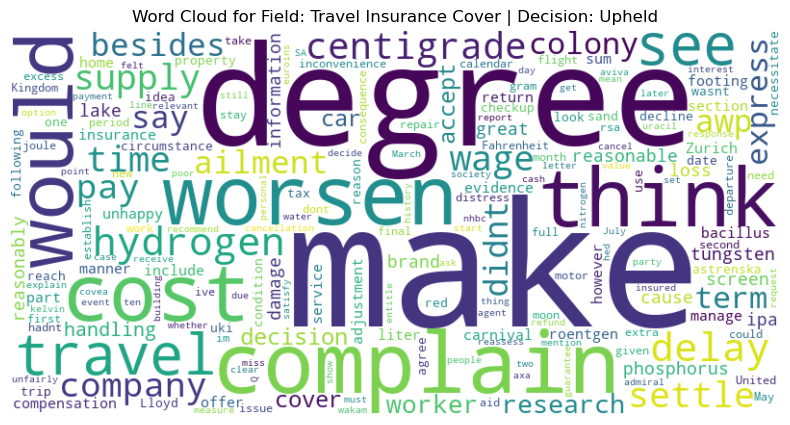

Top 50 Word Frequencies for Field: Travel Insurance Cover | Decision: Upheld: [('make', 206), ('degree', 127), ('complain', 125), ('worsen', 117), ('think', 115), ('cost', 109), ('would', 109), ('travel', 100), ('see', 99), ('hydrogen', 92), ('delay', 90), ('centigrade', 89), ('settle', 85), ('supply', 83), ('time', 83), ('wage', 82), ('company', 78), ('pay', 77), ('didnt', 70), ('say', 67), ('ailment', 67), ('besides', 67), ('awp', 67), ('colony', 66), ('express', 66), ('term', 66), ('research', 66), ('worker', 66), ('decision', 63), ('accept', 61), ('cover', 60), ('car', 60), ('handling', 59), ('phosphorus', 59), ('reasonably', 58), ('cause', 58), ('great', 58), ('tungsten', 58), ('damage', 57), ('lake', 56), ('ipa', 54), ('screen', 53), ('reasonable', 51), ('information', 50), ('loss', 50), ('brand', 49), ('compensation', 47), ('unhappy', 47), ('manage', 47), ('evidence', 45)]


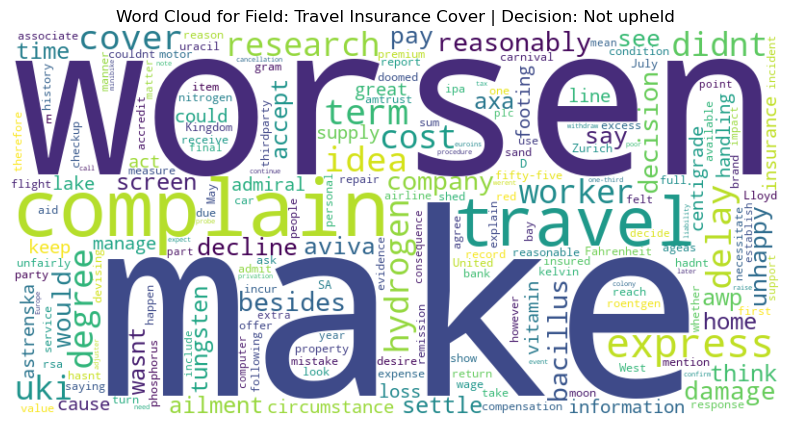

Top 50 Word Frequencies for Field: Travel Insurance Cover | Decision: Not upheld: [('make', 166), ('worsen', 163), ('complain', 116), ('travel', 83), ('express', 79), ('term', 61), ('idea', 58), ('delay', 57), ('cover', 56), ('degree', 54), ('research', 51), ('cost', 50), ('worker', 50), ('didnt', 49), ('uki', 48), ('hydrogen', 47), ('reasonably', 47), ('company', 47), ('besides', 46), ('decision', 46), ('bacillus', 46), ('damage', 43), ('would', 42), ('unhappy', 39), ('aviva', 38), ('pay', 37), ('decline', 37), ('say', 37), ('see', 37), ('settle', 34), ('awp', 34), ('ailment', 33), ('time', 33), ('accept', 33), ('think', 32), ('wasnt', 32), ('tungsten', 32), ('axa', 32), ('screen', 31), ('home', 31), ('circumstance', 30), ('centigrade', 30), ('handling', 29), ('act', 29), ('cause', 29), ('supply', 29), ('great', 29), ('lake', 29), ('information', 28), ('astrenska', 28)]


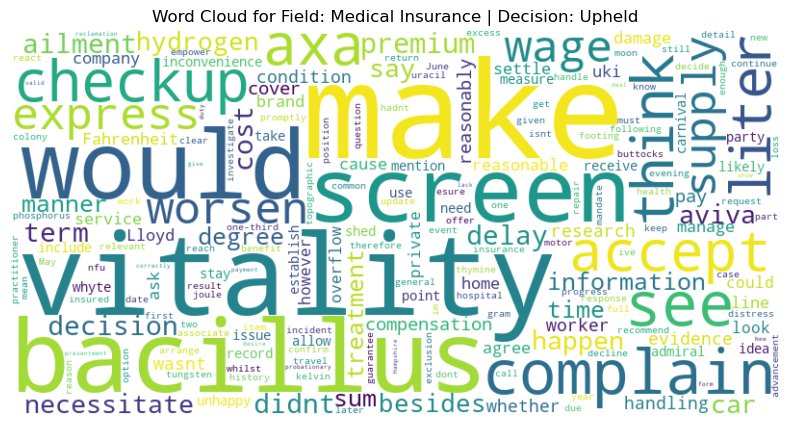

Top 50 Word Frequencies for Field: Medical Insurance | Decision: Upheld: [('make', 185), ('vitality', 125), ('bacillus', 107), ('would', 96), ('screen', 85), ('complain', 71), ('see', 68), ('think', 61), ('checkup', 58), ('axa', 58), ('accept', 57), ('liter', 57), ('express', 54), ('supply', 54), ('wage', 53), ('worsen', 52), ('premium', 52), ('decision', 50), ('delay', 49), ('cost', 49), ('didnt', 48), ('term', 47), ('ailment', 47), ('happen', 45), ('necessitate', 44), ('say', 44), ('car', 44), ('aviva', 44), ('hydrogen', 43), ('besides', 42), ('treatment', 40), ('manner', 39), ('information', 39), ('degree', 39), ('sum', 38), ('time', 38), ('compensation', 37), ('pay', 37), ('reasonably', 37), ('cover', 37), ('research', 35), ('worker', 35), ('handling', 35), ('whether', 34), ('condition', 34), ('evidence', 34), ('wasnt', 34), ('agree', 32), ('home', 32), ('settle', 32)]


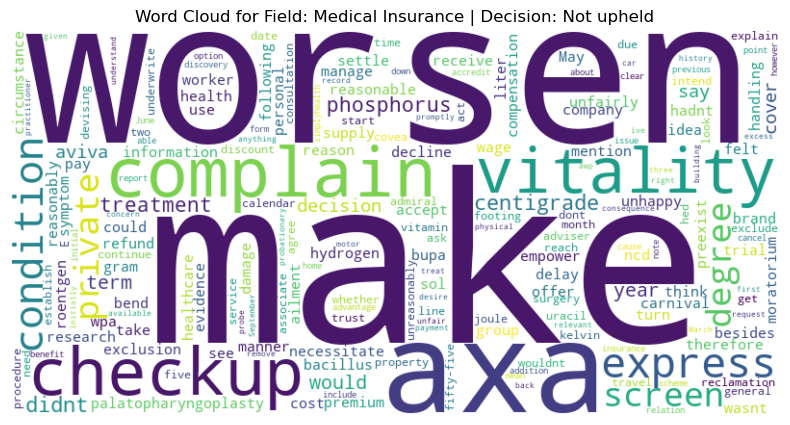

Top 50 Word Frequencies for Field: Medical Insurance | Decision: Not upheld: [('make', 131), ('worsen', 94), ('axa', 94), ('complain', 92), ('checkup', 84), ('vitality', 82), ('express', 75), ('condition', 69), ('private', 50), ('degree', 49), ('screen', 46), ('centigrade', 42), ('didnt', 42), ('treatment', 40), ('phosphorus', 40), ('term', 38), ('would', 38), ('year', 38), ('cover', 36), ('aviva', 36), ('say', 35), ('decision', 35), ('palatopharyngoplasty', 35), ('information', 35), ('liter', 35), ('ailment', 34), ('see', 32), ('besides', 32), ('bacillus', 31), ('supply', 31), ('manage', 30), ('pay', 30), ('hydrogen', 29), ('wasnt', 28), ('wpa', 28), ('use', 27), ('think', 26), ('cost', 26), ('turn', 26), ('idea', 25), ('delay', 25), ('exclusion', 25), ('wage', 25), ('reason', 25), ('manner', 24), ('unfairly', 24), ('unhappy', 24), ('health', 24), ('therefore', 24), ('reasonable', 24)]


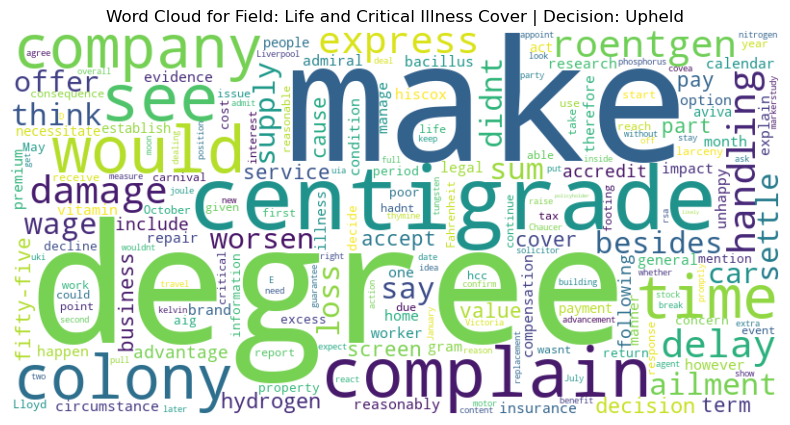

Top 50 Word Frequencies for Field: Life and Critical Illness Cover | Decision: Upheld: [('make', 102), ('degree', 100), ('centigrade', 83), ('complain', 69), ('see', 64), ('would', 63), ('colony', 55), ('time', 54), ('company', 52), ('roentgen', 47), ('handling', 46), ('damage', 46), ('express', 46), ('delay', 46), ('ailment', 46), ('think', 44), ('loss', 43), ('sum', 42), ('besides', 42), ('didnt', 41), ('settle', 41), ('wage', 40), ('say', 39), ('offer', 37), ('car', 37), ('worsen', 37), ('supply', 36), ('hydrogen', 34), ('decision', 34), ('accept', 32), ('screen', 32), ('cause', 31), ('value', 31), ('part', 30), ('pay', 30), ('fifty-five', 29), ('service', 29), ('cover', 28), ('business', 27), ('term', 26), ('advantage', 25), ('accredit', 25), ('following', 24), ('include', 24), ('reasonably', 24), ('brand', 23), ('insurance', 23), ('research', 23), ('worker', 23), ('condition', 23)]


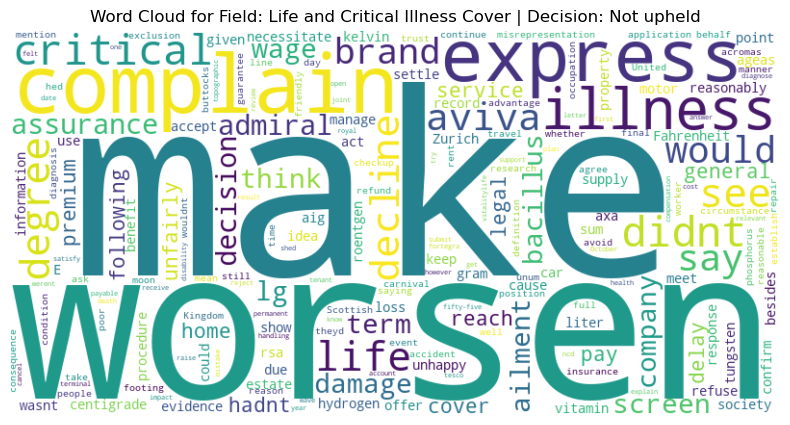

Top 50 Word Frequencies for Field: Life and Critical Illness Cover | Decision: Not upheld: [('make', 129), ('worsen', 116), ('complain', 88), ('express', 70), ('illness', 55), ('critical', 47), ('didnt', 47), ('life', 43), ('degree', 43), ('see', 43), ('decline', 41), ('aviva', 39), ('say', 38), ('would', 37), ('brand', 35), ('admiral', 35), ('assurance', 34), ('decision', 33), ('damage', 31), ('ailment', 31), ('lg', 30), ('term', 29), ('bacillus', 29), ('company', 29), ('wage', 28), ('screen', 28), ('think', 28), ('general', 27), ('pay', 27), ('service', 26), ('hadnt', 26), ('premium', 26), ('following', 26), ('cover', 25), ('legal', 25), ('delay', 25), ('unfairly', 24), ('reach', 24), ('home', 24), ('centigrade', 24), ('wasnt', 23), ('reasonably', 23), ('gram', 23), ('hydrogen', 23), ('supply', 22), ('idea', 21), ('act', 21), ('society', 21), ('cause', 20), ('vitamin', 20)]


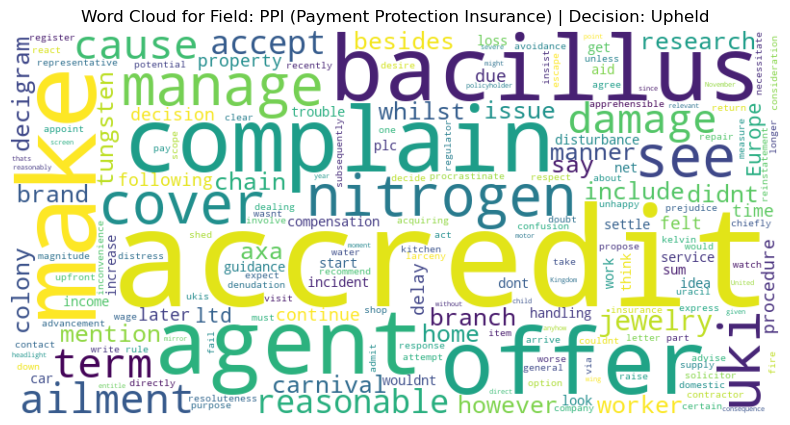

Top 50 Word Frequencies for Field: PPI (Payment Protection Insurance) | Decision: Upheld: [('accredit', 16), ('make', 9), ('complain', 6), ('agent', 6), ('offer', 6), ('bacillus', 6), ('nitrogen', 5), ('manage', 5), ('see', 5), ('cover', 5), ('uki', 5), ('damage', 4), ('term', 4), ('cause', 4), ('ailment', 4), ('reasonable', 4), ('accept', 4), ('jewelry', 4), ('manner', 3), ('home', 3), ('include', 3), ('mention', 3), ('however', 3), ('besides', 3), ('research', 3), ('worker', 3), ('whilst', 3), ('didnt', 3), ('colony', 3), ('issue', 3), ('carnival', 3), ('brand', 3), ('tungsten', 3), ('decigram', 3), ('chain', 3), ('say', 3), ('branch', 3), ('axa', 3), ('Europe', 2), ('ltd', 2), ('following', 2), ('property', 2), ('decision', 2), ('felt', 2), ('due', 2), ('delay', 2), ('continue', 2), ('time', 2), ('procedure', 2), ('later', 2)]


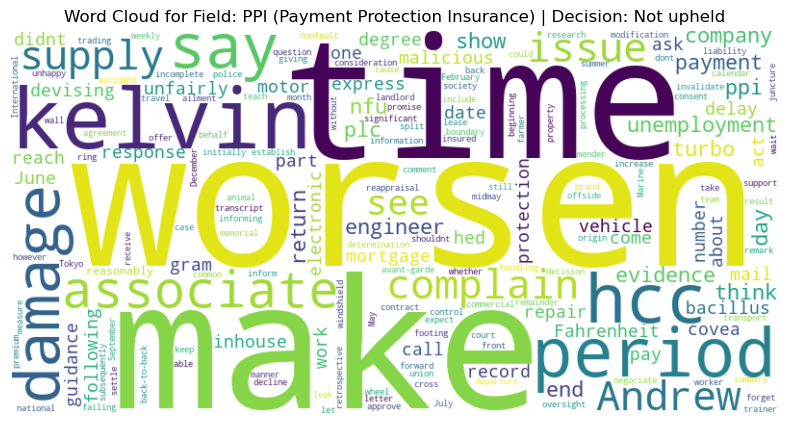

Top 50 Word Frequencies for Field: PPI (Payment Protection Insurance) | Decision: Not upheld: [('worsen', 9), ('make', 8), ('time', 7), ('kelvin', 7), ('period', 6), ('hcc', 6), ('say', 5), ('damage', 5), ('associate', 5), ('complain', 4), ('supply', 4), ('issue', 4), ('Andrew', 4), ('see', 3), ('unemployment', 3), ('end', 3), ('plc', 3), ('payment', 3), ('ppi', 3), ('company', 3), ('think', 3), ('show', 3), ('return', 3), ('engineer', 3), ('turbo', 3), ('evidence', 3), ('nfu', 3), ('day', 3), ('about', 2), ('date', 2), ('come', 2), ('degree', 2), ('Fahrenheit', 2), ('covea', 2), ('mortgage', 2), ('protection', 2), ('devising', 2), ('one', 2), ('June', 2), ('part', 2), ('work', 2), ('pay', 2), ('bacillus', 2), ('unfairly', 2), ('malicious', 2), ('didnt', 2), ('act', 2), ('hed', 2), ('delay', 2), ('repair', 2)]


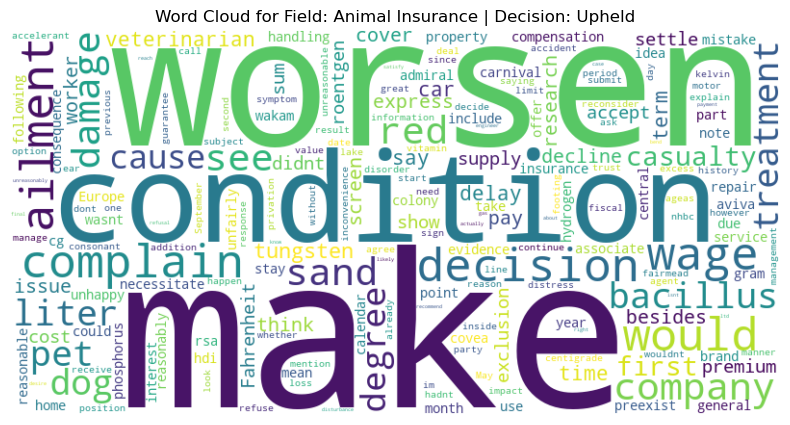

Top 50 Word Frequencies for Field: Animal Insurance | Decision: Upheld: [('make', 119), ('worsen', 84), ('condition', 74), ('complain', 67), ('wage', 66), ('decision', 66), ('ailment', 65), ('would', 61), ('company', 58), ('red', 58), ('sand', 58), ('see', 57), ('damage', 56), ('bacillus', 51), ('pet', 51), ('treatment', 51), ('dog', 50), ('liter', 50), ('degree', 47), ('cause', 42), ('casualty', 42), ('first', 42), ('tungsten', 42), ('veterinarian', 40), ('car', 40), ('say', 40), ('delay', 39), ('time', 39), ('term', 38), ('besides', 36), ('think', 36), ('express', 35), ('pay', 35), ('screen', 35), ('issue', 34), ('research', 34), ('worker', 34), ('decline', 34), ('cover', 33), ('cost', 31), ('settle', 31), ('show', 31), ('didnt', 31), ('roentgen', 31), ('exclusion', 31), ('sum', 30), ('premium', 30), ('Fahrenheit', 30), ('accept', 29), ('supply', 29)]


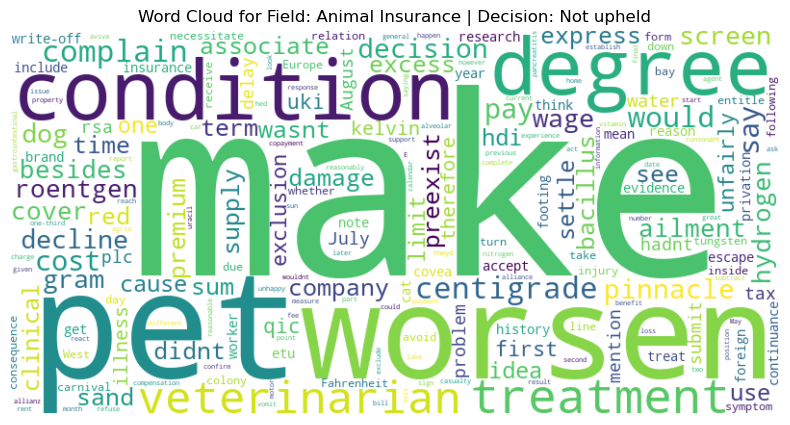

Top 50 Word Frequencies for Field: Animal Insurance | Decision: Not upheld: [('make', 105), ('pet', 100), ('worsen', 76), ('condition', 73), ('degree', 66), ('treatment', 63), ('veterinarian', 54), ('centigrade', 52), ('complain', 52), ('would', 49), ('pay', 46), ('say', 45), ('cost', 45), ('pinnacle', 41), ('decision', 40), ('dog', 38), ('wage', 37), ('gram', 37), ('screen', 37), ('decline', 37), ('ailment', 35), ('besides', 34), ('roentgen', 33), ('hydrogen', 33), ('cover', 32), ('see', 30), ('associate', 29), ('company', 29), ('time', 29), ('damage', 29), ('express', 28), ('preexist', 28), ('premium', 27), ('didnt', 27), ('term', 27), ('bacillus', 27), ('supply', 26), ('excess', 26), ('red', 25), ('sand', 25), ('wasnt', 25), ('sum', 25), ('clinical', 24), ('use', 24), ('cause', 24), ('idea', 23), ('settle', 23), ('hdi', 23), ('one', 22), ('limit', 22)]


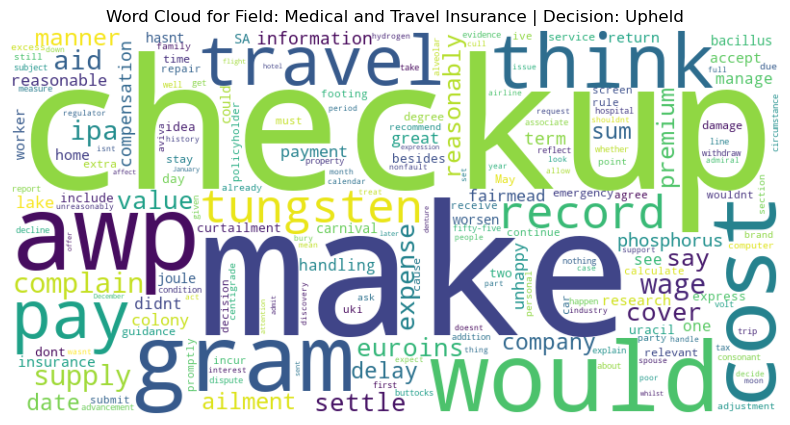

Top 50 Word Frequencies for Field: Medical and Travel Insurance | Decision: Upheld: [('checkup', 41), ('make', 41), ('awp', 39), ('would', 32), ('gram', 30), ('cost', 28), ('think', 28), ('travel', 23), ('pay', 22), ('tungsten', 22), ('record', 22), ('complain', 21), ('wage', 21), ('supply', 21), ('aid', 20), ('ipa', 20), ('expense', 19), ('settle', 18), ('cover', 18), ('euroins', 18), ('value', 18), ('manner', 17), ('reasonably', 17), ('say', 17), ('premium', 17), ('ailment', 16), ('sum', 15), ('company', 15), ('delay', 15), ('date', 15), ('phosphorus', 15), ('compensation', 14), ('information', 14), ('term', 14), ('great', 13), ('lake', 13), ('unhappy', 13), ('colony', 13), ('reasonable', 13), ('payment', 13), ('fairmead', 13), ('manage', 12), ('didnt', 12), ('handling', 12), ('see', 12), ('one', 12), ('research', 11), ('worker', 11), ('accept', 11), ('insurance', 11)]


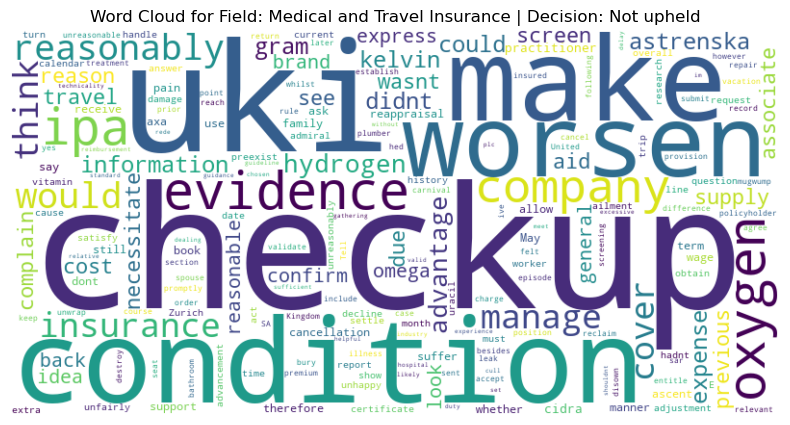

Top 50 Word Frequencies for Field: Medical and Travel Insurance | Decision: Not upheld: [('checkup', 31), ('uki', 24), ('make', 13), ('condition', 13), ('worsen', 12), ('evidence', 11), ('oxygen', 11), ('ipa', 10), ('company', 9), ('reasonably', 9), ('would', 9), ('insurance', 8), ('cover', 8), ('think', 8), ('manage', 8), ('hydrogen', 8), ('advantage', 8), ('information', 7), ('kelvin', 7), ('could', 7), ('expense', 7), ('gram', 7), ('didnt', 7), ('astrenska', 7), ('supply', 6), ('aid', 6), ('necessitate', 6), ('screen', 6), ('complain', 6), ('travel', 6), ('reason', 6), ('wasnt', 6), ('cost', 6), ('due', 6), ('previous', 6), ('see', 6), ('associate', 6), ('look', 5), ('reasonable', 5), ('brand', 5), ('confirm', 5), ('idea', 5), ('express', 5), ('back', 5), ('omega', 5), ('general', 5), ('practitioner', 5), ('cidra', 5), ('say', 4), ('allow', 4)]


In [19]:
############ The word frequency and word cloud are examined separately for different decisions on the complaint text of different insurance fields
import pandas as pd
import os
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
from collections import Counter
import fitz  # PyMuPDF
import re
import nltk
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')

def extract_text_and_claims(pdf_path, keyword):
    text = ""
    with fitz.open(pdf_path) as doc:
        for page in doc:
            text += page.get_text()

    complaint_pattern = r'The complaint\s*((?:[\s\S](?!What happened))*.)'
    complaint_match = re.search(complaint_pattern, text)
    
    happened_pattern = r'What happened\s*([\s\S]*?)(?=What I’ve decided – and why|What I provisionally said|What I provisionally decided – and why)'
    happened_match = re.search(happened_pattern, text)
    
    complaint_text = complaint_match.group(1).strip() if complaint_match else ""
    happened_text = happened_match.group(1).strip() if happened_match else ""
    
    combined_text = complaint_text + " " + happened_text
    
    sentences = re.split(r'(?<=[.!?])\s+', combined_text)
    
    keyword_text = ' '.join([sentence for sentence in sentences if keyword.lower() in sentence.lower()])
    
    return keyword_text


def expand_contractions(text):
    contractions_dict = {
        "n't": " not",
        "'re": " are",
        "'s": " is",
        "'d": " would",
        "'ll": " will",
        "'t": " not",
        "'ve": " have",
        "'m": " am"
    }
    
    contractions_re = re.compile('(%s)' % '|'.join(contractions_dict.keys()))

    def replace(match):
        return contractions_dict[match.group(0)]

    return contractions_re.sub(replace, text)

def get_synonym(word, pos=None):
    synsets = wn.synsets(word, pos=pos)
    if not synsets:
        return word
    synonym = synsets[0].lemmas()[0].name()
    return synonym.replace('_', ' ')

def preprocess_text(text):
    text = text.lower()
    text = expand_contractions(text)
    text = re.sub(r'[^a-z\s]', '', text)
    text = re.sub(r'\b(Mr|Mrs|Ms|Mx|Miss|Dr|Prof)\b', '', text, flags=re.IGNORECASE)
    tokens = word_tokenize(text)
    stop_words = set(stopwords.words('english'))
    lemmatizer = WordNetLemmatizer()
    processed_tokens = [get_synonym(lemmatizer.lemmatize(word)) for word in tokens if word not in stop_words]
    processed_tokens = [word for word in processed_tokens if word not in ['insurance', 'policy', 'claim', 'state', ]]
    processed_text = ' '.join(processed_tokens) 
    return processed_text

df = pd.read_csv('D:/dissertation/session 2/merged_output.csv', encoding='ISO-8859-1')
base_path = 'D:/dissertation/session 2/decisions_half'

fields = df['field'].unique()
decisions = ['Upheld', 'Not upheld']

for field in fields:
    for decision in decisions:
        all_text = ""  
        subset = df[(df['field'] == field) & (df['decision'] == decision)]

        for decision_id in subset['decision_id']:
            pdf_path = f'{base_path}/{decision_id}.pdf'
            try:
                raw_text = extract_text_and_claims(pdf_path, 'claim')
                processed_text = preprocess_text(raw_text)
                all_text += " " + processed_text
            except Exception as e:
                print(f"Error processing file {pdf_path}: {str(e)}")

        if not all_text.strip():
            print(f"No text extracted for Field: {field}, Decision: {decision}")
            continue

        words = all_text.split()
        word_counts = Counter(words)
        top_50_words = word_counts.most_common(50)

        wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(word_counts)

        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f'Word Cloud for Field: {field} | Decision: {decision}')
        plt.axis('off')
        plt.show()
        print(f"Top 50 Word Frequencies for Field: {field} | Decision: {decision}:", top_50_words)


Category counts:
 category
Claim Denials and Disputes                   1901
Uncategorized                                 568
Delay in processing of compensation           485
Policy Misrepresentation and Sales Issues     223
Customer Service and Support                   49
Settlement and Financial Discrepancies         37
Legal and Compliance Issues                    26
Pricing and renewal disputes                   17
Technical and Coverage Specific Issues          8
Name: count, dtype: int64
Category by Field:
 category                                     Claim Denials and Disputes  \
field                                                                     
Animal Insurance                                                    109   
Household and Commercial Property Insurance                         521   
Legal Expenses and Monetary Loss Insurance                          197   
Life and Critical Illness Cover                                     128   
Medical Insurance          

C:\Users\DELL\AppData\Local\Temp\ipykernel_16452\3381095852.py:16: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['date'] = pd.to_datetime(df['date'])
C:\Users\DELL\AppData\Local\Temp\ipykernel_16452\3381095852.py:43: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab20', len(fields))


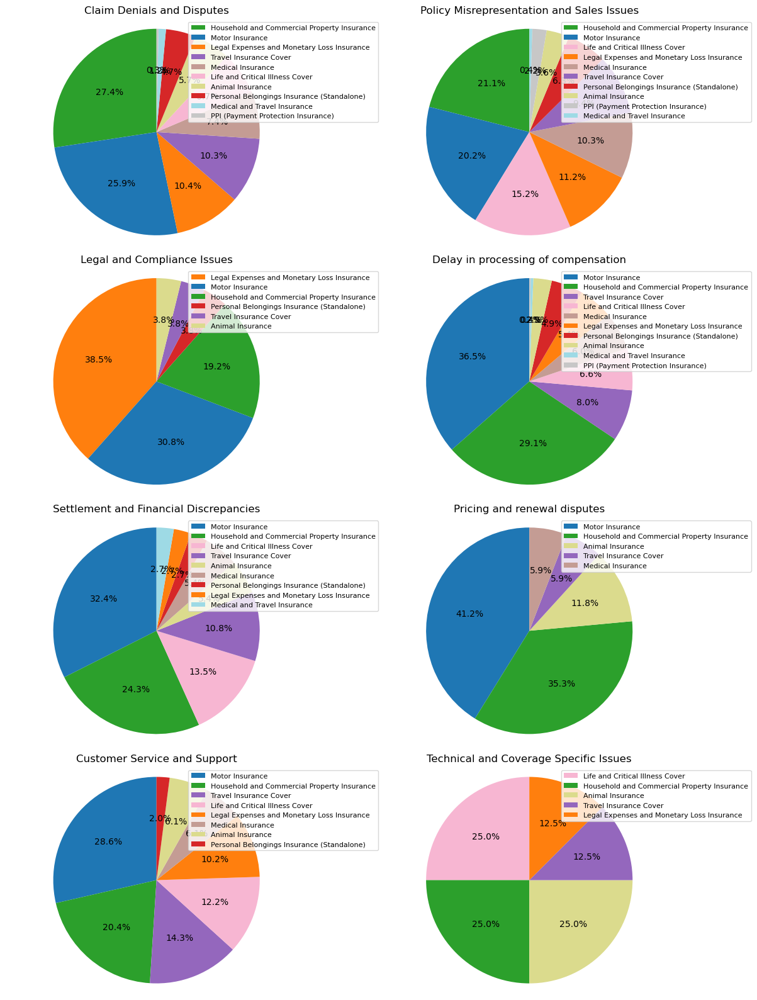

In [54]:
######### Exploratory analysis of the causes of complaints
import pandas as pd
from scipy.stats import pearsonr

df = pd.read_csv('D:/dissertation/session 2/merged_output_claim.csv', encoding='ISO-8859-1')

# Perform statistical analysis on the category column
category_counts = df['category'].value_counts()
print("Category counts:\n", category_counts)

# The category column and field column are combined for analysis
category_field_counts = df.groupby(['field', 'category']).size().unstack(fill_value=0)
print("Category by Field:\n", category_field_counts)

# See how categories relate to the month
df['date'] = pd.to_datetime(df['date'])
df['month'] = df['date'].dt.month
category_month_counts = df.groupby(['month', 'category']).size().unstack(fill_value=0)
print("Category by Month:\n", category_month_counts)

df['support'] = (df['decision'] == 'Upheld').astype(int)

# Calculate the average approval rating for each category
support_rates = df.groupby('category')['support'].mean()
print("Support Rates by Category:\n", support_rates)

category_dummies = pd.get_dummies(df['category'])
support = df['support']

# The correlation coefficient and P-value between each complaint reason and the approval rate were calculated
for category in category_dummies:
    correlation, p_value = pearsonr(category_dummies[category], support)
    print(f"Correlation between {category} and support is {correlation} with a p-value of {p_value}")

categories = df['category'].unique()
categories = [cat for cat in categories if cat != 'Uncategorized']
    
# Create a color map
fields = df['field'].unique()
colors = plt.cm.get_cmap('tab20', len(fields))
color_map = {field: colors(i) for i, field in enumerate(fields)}

fig, axes = plt.subplots(4, 2, figsize=(12, 16))
axes = axes.flatten()

# Generate pie charts for each cause of complaint
for i, category in enumerate(categories):
    ax = axes[i]
    category_data = df[df['category'] == category]['field'].value_counts()
    colors = [color_map[field] for field in category_data.index]
    patches, texts, autotexts = ax.pie(category_data, startangle=90, colors=colors, autopct='%1.1f%%')
    ax.set_title(category)
    ax.axis('equal')
    
    ax.legend(patches, category_data.index, loc='upper right', bbox_to_anchor=(1.25, 1), fontsize=8)

for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('D:/dissertation/session 2/paper/field_with_category.png', format='png', dpi=300)
plt.show()